In [ ]:
import pandas as pd

splits = {'train': 'data/train-00000-of-00001-8e16187b3ec7909d.parquet', 'test': 'data/test-00000-of-00001-68e8585122b38261.parquet'}
df = pd.read_parquet("hf://datasets/ahishamm/isic_binary_augmented/" + splits["train"])

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import io
import tensorflow as tf
import os
import pickle
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score, precision_score, recall_score, ConfusionMatrixDisplay, f1_score, roc_auc_score, roc_curve, confusion_matrix, classification_report)
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import load_model
import warnings
warnings.filterwarnings('ignore')

In [ ]:
print(df.columns.tolist())
print(df['label'].value_counts())

['image', 'label']
label
0    8849
1    8365
Name: count, dtype: int64


Since we already have two classes (0 and 1) and they are balanced, we can proceed to data spliting. Perform a stratify split into train/validation/test.

In [ ]:
X_temp, X_test, y_temp, y_test = train_test_split(df['image'], df['label'], test_size=0.15, stratify=df['label'], random_state=42)

X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.1765, stratify=y_temp, random_state=42)

print(f'Train: {len(X_train)}')
print(f'Validation: {len(X_val)}')
print(f'Test: {len(X_test)}')

Train: 12048
Validation: 2583
Test: 2583


In [ ]:
print(type(df['image'].iloc[0]))
print(df['image'].iloc[0].keys())

<class 'dict'>
dict_keys(['bytes', 'path'])


For Hugging Face datasets, images are stored in dictionaries with metadata. The data type in the 'image' column is dict, where the bytes or path key contains the image.

In [ ]:
df['image_bytes'] = df['image'].apply(lambda x: x['bytes'] if isinstance(x, dict) else x)
X_train = df.loc[X_train.index, 'image_bytes']
X_val = df.loc[X_val.index, 'image_bytes']
X_test = df.loc[X_test.index, 'image_bytes']

Next step: to handle your data efficiently in TensorFlow, we will build a pipeline using tf.data.Dataset. Start with a function for image preprocessing.

- tesor is essentially a multi-dimensional array of data (data structure).
- map is a transformation operation that applies a specific function to every individual element in a dataset to produce a new dataset of modified results.
- batching is the process of grouping multiple individual data elements into a single collection (a "batch") so that the computer can process them simultaneously.

In [ ]:
def remove_black_boarders(image, threshold=0.05):
  gray = tf.image.rgb_to_grayscale(image)
  mask = gray > threshold
  coords = tf.where(mask)
  y_min = tf.reduce_min(coords[:, 0])
  x_min = tf.reduce_min(coords[:, 1])
  y_max = tf.reduce_max(coords[:, 0])
  x_max = tf.reduce_max(coords[:, 1])
  image = image[y_min:y_max+1, x_min:x_max+1, :]
  return image

def remove_thin_artifacts(image, kernel_size=3):
  """
  Removes thin artifacts using morphological operations. Performed on each channel separately
  """
  kernel = tf.ones((kernel_size, kernel_size), tf.float32)

  channels = tf.unstack(image, axis=-1)
  cleaned_channels = []

  for channel in channels:
    channel_4d = channel[tf.newaxis, ..., tf.newaxis]

    padded = tf.pad(channel_4d, [[0,0], [1,1], [1,1], [0,0]], mode='REFLECT')
    dilated = tf.nn.max_pool2d(padded, ksize=kernel_size, strides=1, padding='VALID')

    padded2 = tf.pad(dilated, [[0,0], [1,1], [1,1], [0,0]], mode='REFLECT')
    eroded = -tf.nn.max_pool2d(-padded2, ksize=kernel_size, strides=1, padding='VALID')

    cleaned_channels.append(eroded[0, ..., 0])

  image_cleaned = tf.stack(cleaned_channels, axis=-1)
  return image_cleaned

def preprocess_image(image_bytes, label, target_size=(224, 224)):
  image = tf.image.decode_jpeg(image_bytes, channels=3)
  image = tf.cast(image, tf.float32) / 255.0
  image = remove_black_boarders(image, threshold=0.05)
  image = remove_thin_artifacts(image, kernel_size=3)
  image = tf.image.resize(image, target_size)
  image = tf.clip_by_value(image, 0.0, 1.0)
  return image, label

augmentation_layers = tf.keras.Sequential([
      tf.keras.layers.RandomFlip('horizontal_and_vertical'),
      tf.keras.layers.RandomRotation(0.05),
      tf.keras.layers.RandomZoom(0.1),
      tf.keras.layers.RandomBrightness(0.002),
      tf.keras.layers.RandomContrast(0.002)])

def augment_function(image, label):
  image = augmentation_layers(image, training=True)
  image = tf.clip_by_value(image, 0.0, 1.0)
  return image, label

def create_dataset(image_series, label_series, batch_size=32, augment=False):
  dataset = tf.data.Dataset.from_tensor_slices((image_series.values, label_series.values))
  dataset = dataset.map(lambda img, lbl: preprocess_image(img, lbl), num_parallel_calls=tf.data.AUTOTUNE)
  if augment:
    dataset = dataset.map(augment_function, num_parallel_calls=tf.data.AUTOTUNE)
  dataset = dataset.batch(batch_size)
  dataset = dataset.prefetch(tf.data.AUTOTUNE)
  return dataset

batch_size = 32
train_ds = create_dataset(X_train, y_train, batch_size, augment=True)
val_ds = create_dataset(X_val, y_val, batch_size, augment=False)
test_ds = create_dataset(X_test, y_test, batch_size, augment=False)


After creating the train_ds with augmentation, we need to visualize a few examples. Here is the displayed 6 augmented images (original + augmented).

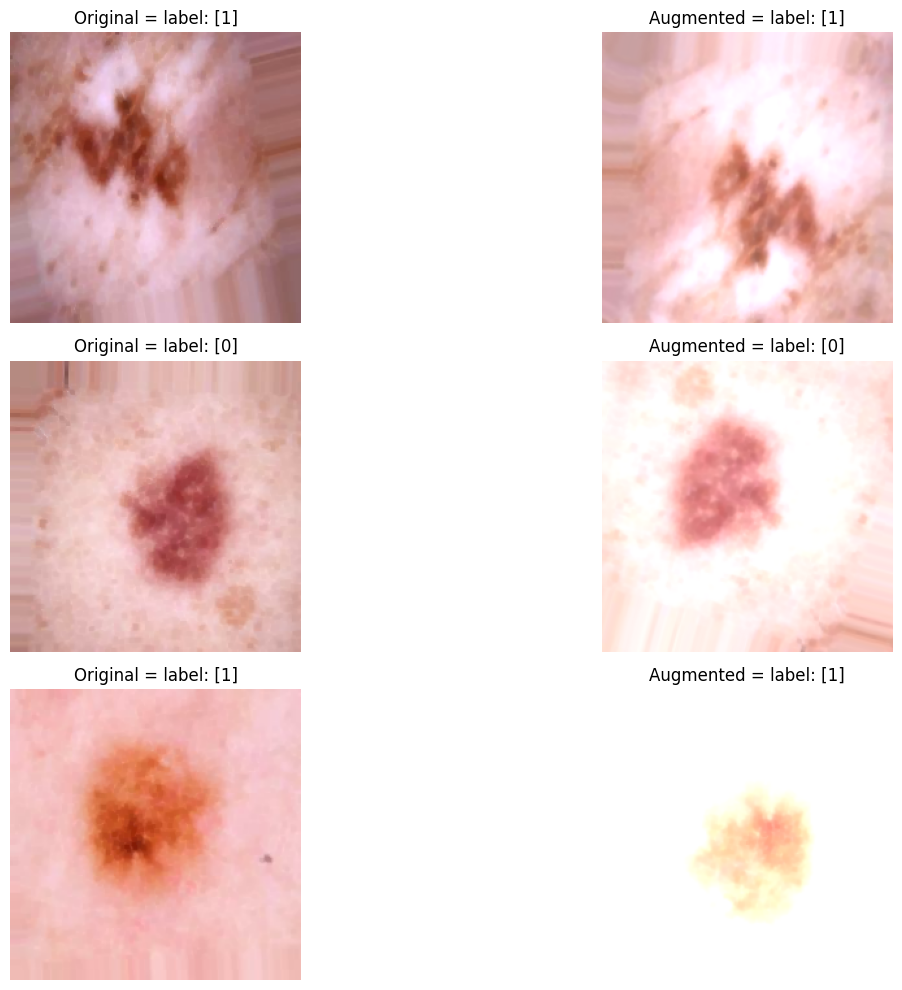

In [ ]:
def visualize_original_vs_augmented(original_ds, augmented_ds, num_pairs=3):
  plt.figure(figsize=(15, 10))
  for i, ((orig_img, orig_lbl), (aug_img, aug_lbl)) in enumerate(zip(original_ds.take(num_pairs), augmented_ds.take(num_pairs))):
    orig_img = orig_img.numpy().squeeze(0)
    aug_img = aug_img.numpy().squeeze(0)
    orig_img = np.clip(orig_img, 0, 1)
    aug_img = np.clip(aug_img, 0, 1)
    plt.subplot(num_pairs, 2, 2*i+1)
    plt.imshow(orig_img)
    plt.title(f'Original = label: {orig_lbl.numpy()}')
    plt.axis('off')

    plt.subplot(num_pairs, 2, 2*i+2)
    plt.imshow(aug_img)
    plt.title(f'Augmented = label: {aug_lbl.numpy()}')
    plt.axis('off')
  plt.tight_layout()
  plt.show()

train_ds_no_aug = create_dataset(X_train, y_train, batch_size=1, augment=False)
visualize_original_vs_augmented(train_ds_no_aug, train_ds.unbatch().batch(1), num_pairs=3)

Report on completed steps and errors: the binary dataset (classes 0 and 1) has beed loaded. A stratified split into train/val/test has been performed. A `tf.data` pipeline has been implemented with JPEG decoding, [0,1] normalization, and resizing to 224 x 224. Flipping, rotation, zoom, brightness/contrast with clipping to [0,1] transformation were added. The function `remove_black_borders` (cropping black margin) and `remove_thin_artifacts` (morphological closing to remove microscope streaks) have been implemented. TensorFlow compatibility errors occurred when using `dilation2d/erosion2d`. The function were simplified but may slow down the pipeline. Preprocessing is working, augmentation is configured, and datasets are ready for training.

- kernel is a weight matrix applied to an image during convolution to extract local features (edges, textures).
- augmentation need to increase the size of the training set and improve model generalization by generating artificial image variants that mimic natural variations.
- morphological operation is a mathematical operation on binary or grayscale images to change the structure of objects, often used to remove noise or artifacts.
- normalization is the process of scaling data to a uniform range (e.g., [0,1]), which accelerates neural network training and improves its stability.
- generalization is the ability of a model to perform correctly on new, unseen data, rather than just on the training set.


In [ ]:
def build_scratch_cnn(input_shape=(224, 224, 3)):
  model = models.Sequential()

  # blok-1
  model.add(layers.Conv2D(32, (3, 3), padding='same', input_shape=input_shape))
  model.add(layers.BatchNormalization())
  model.add(layers.ReLU())
  model.add(layers.Conv2D(32, (3,3), padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.ReLU())
  model.add(layers.MaxPooling2D((2,2)))
  model.add(layers.Dropout(0.25))

  # blok-2
  model.add(layers.Conv2D(64, (3,3), padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.ReLU())
  model.add(layers.Conv2D(64, (3,3), padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.ReLU())
  model.add(layers.MaxPooling2D((2,2)))
  model.add(layers.Dropout(0.25))

  # blok-3
  model.add(layers.Conv2D(128, (3,3), padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.ReLU())
  model.add(layers.Conv2D(128, (3,3), padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.ReLU())
  model.add(layers.MaxPooling2D((2,2)))
  model.add(layers.Dropout(0.3))

  # blok-4
  model.add(layers.Conv2D(256, (3,3), padding='same'))
  model.add(layers.BatchNormalization())
  model.add(layers.ReLU())
  model.add(layers.MaxPooling2D((2,2)))
  model.add(layers.Dropout(0.35))

  # head
  model.add(layers.GlobalAveragePooling2D())
  model.add(layers.Dense(128, activation='relu'))
  model.add(layers.Dropout(0.5))
  model.add(layers.Dense(1, activation='sigmoid'))

  return model

scratch_model = build_scratch_cnn()
scratch_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu (ReLU)                    │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_1 (ReLU)                  │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_2 (ReLU)                  │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_3 (ReLU)                  │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_4 (ReLU)                  │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_5 (ReLU)                  │ (None, 56, 56, 128)    │             

 Total params: 618,017 (2.36 MB)

 Trainable params: 616,609 (2.35 MB)

 Non-trainable params: 1,408 (5.50 KB)

- scratch: training a neural network with random weight initialization without using pre-trained models (transfer learning). The entire architecture is created and trained on our data from the ground up.
- `Sequential` is a container in TensorFlow/Keras that allows us to add layers sequentially, one after another. It is suitable for simple architectures where each layer has exactly one input and one output.
- Conv2D(32, (3,3)) is a convolutional layer:
  - 32 is the number of filters (kernels) that well learn 32 different features (edges, textures);
  - (3,3) is the size of each filter (3x3 pixels);
  - output: a feature map with a depth of 32.
- `BatchNormalization()` stabilizes training by normalizing the output of the previous layer (bringing it to a mean of 0 and variance of 1). It accelerates convergence and allows for higher learning rates. Usually applied after Conv2D/Dense but before the activation (ReLU).
- `ReLU()` (Rectified Linear Unit) is an activation function: `F(x) = max(0,x)`.  It adds non-linearity, without which the network would remain linear. It speeds up training compared to sigmoid or tanh.
- `MaxPooling2D((2,2))` reduces the dimensions of the feature map by keeping only the maximum value within a 2x2 window. Goal: reduce computational complexity, retain important deatures, and provide invariance to small shifts.
- `Dropout(0.25)` is a regularization technique that randomly "deactivates" 25% of the neurons in a layer during training. Goal: prevent overfitting by forcing the network to become more robust.
- `GlobalAveragePooling2D()` averages the entire feature map across its width and height, leaving only the depth. Example: thransforms (7,7,256) -> (256,).
- `Dense(128, activation='rule')` is a fully connected layer:
  - 128 - number of neurons. Each neuron is connected to every input from previous layer;
  - uses the ReLU activation function.
- `Dense(1, activation='sigmoid')` is the output layer for binary classification:
  - 1 neuron (one output: the probability of class 1);
  - `sigmoid` - squashes the output into a [0,1] range (probability).

---

GlobalAveragePooling2D + Dense averages each feature map across width and height to get a vector of length 256, then passes it to a Dense layer.

The output of a Dense layer is not restricted (e.g., [-1,1] unless an activation function is specified.
- without activation: values can be anything (-infty to +infty);
- with relu values range from 0 to +infty;
- with sigmoid values range from 0 to 1.

Sparse vs. Dense

Sparse is a representation with many zeros (e.g., one-hot encoding).

Dense is a representation where almost all values are non-zero (e.g., the output of a convolutional layer or an embedding).

Embeddings are a way to translate tokens, which are words or pieces of words, into numbers that the computer can manipulate.


In [ ]:
scratch_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='binary_crossentropy',
    metrics=['accuracy',
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall'),
             tf.keras.metrics.AUC(name='auc')]
)

log_dir = os.path.join('logs', 'scratch_cnn', datetime.now().strftime('%Y%m%d-%H%M%S'))
os.makedirs(log_dir, exist_ok=True)

callbacks = [
    tf.keras.callbacks.TensorBoard(
        log_dir=log_dir,
        histogram_freq=1,
        write_graph=True,
        write_images=False,
        update_freq='epoch'
    ),

    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True
    ),

    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=5,
        min_lr=1e-6
    )
]

%load_ext tensorboard
%tensorboard --logdir logs/scratch_cnn

history = scratch_model.fit(
    train_ds,
    epochs=100,
    validation_data=val_ds,
    callbacks=callbacks,
    verbose=1
)

scratch_model.save('scratch_cnn_isic.h5')

with open('scratch_history.pkl', 'wb') as f:
    pickle.dump(history.history, f)

<IPython.core.display.Javascript object>

Epoch 1/100
377/377 ━━━━━━━━━━━━━━━━━━━━ 80s 150ms/step - accuracy: 0.7217 - auc: 0.7888 - loss: 0.5687 - precision: 0.6911 - recall: 0.7947 - val_accuracy: 0.7379 - val_auc: 0.8645 - val_loss: 0.5012 - val_precision: 0.6572 - val_recall: 0.9625 - learning_rate: 0.0010
Epoch 2/100
377/377 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step - accuracy: 0.7563 - auc: 0.8286 - loss: 0.5046 - precision: 0.7151 - recall: 0.8452 - val_accuracy: 0.7240 - val_auc: 0.8439 - val_loss: 0.5265 - val_precision: 0.7528 - val_recall: 0.6430 - learning_rate: 0.0010
Epoch 3/100
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step - accuracy: 0.7635 - auc: 0.8419 - loss: 0.4846 - precision: 0.7236 - recall: 0.8461 - val_accuracy: 0.7987 - val_auc: 0.8776 - val_loss: 0.4579 - val_precision: 0.7245 - val_recall: 0.9450 - learning_rate: 0.0010
Epoch 4/100
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step - accuracy: 0.7691 - auc: 0.8427 - loss: 0.4792 - precision: 0.7262 - recall: 0.8569 - val_accuracy: 0.7604 - val_auc: 0.8577 - val_lo

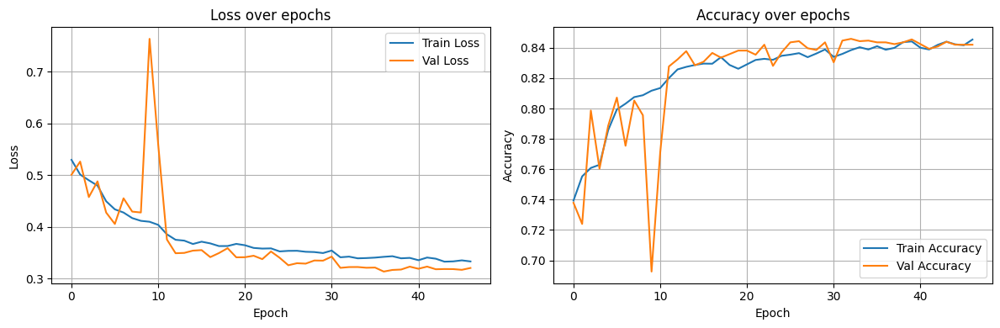

Best epoch: 37
Best val_loss: 0.3139
Val_accuracy: 0.8436
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - accuracy: 0.8507 - auc: 0.9381 - loss: 0.3021 - precision: 0.8283 - recall: 0.8740
Test Loss: 0.3066
Test Accuracy: 0.8467
Test Precision: 0.8237
Test Recall: 0.8709
Test AUC: 0.9351
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/st

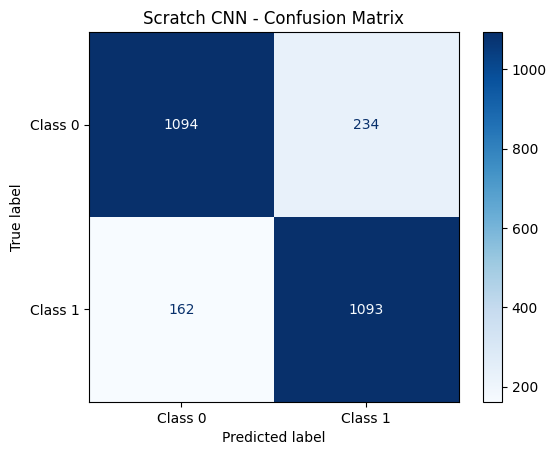

In [ ]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss over epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Accuracy over epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

best_val_epoch = history.history['val_loss'].index(min(history.history['val_loss']))
print(f'Best epoch: {best_val_epoch+1}')
print(f'Best val_loss: {min(history.history['val_loss']):.4f}')
print(f'Val_accuracy: {history.history['val_accuracy'][best_val_epoch]:.4f}')

# evaluate model with test data
test_results = scratch_model.evaluate(test_ds, verbose=1)
print(f'Test Loss: {test_results[0]:.4f}')
print(f'Test Accuracy: {test_results[1]:.4f}')
print(f"Test Precision: {test_results[2]:.4f}")
print(f"Test Recall: {test_results[3]:.4f}")
print(f"Test AUC: {test_results[4]:.4f}")

# confusion matrix
y_pred = []
y_true = []

for images, labels in test_ds:
  y_pred.extend((scratch_model.predict(images) > 0.5).astype(int). flatten())
  y_true.extend(labels.numpy())

cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Class 0', 'Class 1'])
disp.plot(cmap='Blues')
plt.title('Scratch CNN - Confusion Matrix')
plt.show()

In accordance with the project requirements, MobileNetV2 was selected as the primary model for implementing transfer learning.

In [ ]:
# creating the MobileNetV2 base model
base_model = MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

base_model.trainable = False

mobile_model = models.Sequential([
    base_model,
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

mobile_model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 1280)           │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,422,081 (9.24 MB)

 Trainable params: 164,097 (641.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
mobile_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='binary_crossentropy',
    metrics=['accuracy',
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall'),
             tf.keras.metrics.AUC(name='auc')]
)

mobile_callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True,
        verbose=1
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=5,
        min_lr=1e-6,
        verbose=1
    ),
    tf.keras.callbacks.TensorBoard(
        log_dir='logs/mobilenet',
        histogram_freq=1
    ),
    tf.keras.callbacks.ModelCheckpoint(
        'mobile_feature_extraction_best.h5',
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    )
]

# training the feature extraction stage
history_mobile_feature = mobile_model.fit(
    train_ds,
    epochs=100,
    validation_data=val_ds,
    callbacks=mobile_callbacks,
    verbose=1
)

Epoch 1/100
377/377 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.7258 - auc: 0.7974 - loss: 0.5636 - precision: 0.7186 - recall: 0.7383
Epoch 1: val_loss improved from inf to 0.41747, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 103s 214ms/step - accuracy: 0.7259 - auc: 0.7976 - loss: 0.5634 - precision: 0.7187 - recall: 0.7384 - val_accuracy: 0.8022 - val_auc: 0.8912 - val_loss: 0.4175 - val_precision: 0.7743 - val_recall: 0.8367 - learning_rate: 0.0010
Epoch 2/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.7928 - auc: 0.8787 - loss: 0.4306 - precision: 0.7679 - recall: 0.8344
Epoch 2: val_loss improved from 0.41747 to 0.39177, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.7928 - auc: 0.8787 - loss: 0.4306 - precision: 0.7679 - recall: 0.8344 - val_accuracy: 0.8173 - val_auc: 0.9057 - val_loss: 0.3918 - val_precision: 0.8033 - val_recall: 0.8263 - learning_rate: 0.0010
Epoch 3/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8055 - auc: 0.8883 - loss: 0.4175 - precision: 0.7811 - recall: 0.8446
Epoch 3: val_loss improved from 0.39177 to 0.39096, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8055 - auc: 0.8883 - loss: 0.4175 - precision: 0.7811 - recall: 0.8445 - val_accuracy: 0.8149 - val_auc: 0.9047 - val_loss: 0.3910 - val_precision: 0.8052 - val_recall: 0.8167 - learning_rate: 0.0010
Epoch 4/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8142 - auc: 0.9015 - loss: 0.3935 - precision: 0.7895 - recall: 0.8528
Epoch 4: val_loss did not improve from 0.39096
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step - accuracy: 0.8142 - auc: 0.9015 - loss: 0.3935 - precision: 0.7895 - recall: 0.8527 - val_accuracy: 0.8246 - val_auc: 0.9116 - val_loss: 0.3952 - val_precision: 0.8542 - val_recall: 0.7705 - learning_rate: 0.0010
Epoch 5/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8122 - auc: 0.8968 - loss: 0.4007 - precision: 0.7909 - recall: 0.8452
Epoch 5: val_loss improved from 0.39096 to 0.36915, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8122 - auc: 0.8968 - loss: 0.4007 - precision: 0.7909 - recall: 0.8452 - val_accuracy: 0.8277 - val_auc: 0.9166 - val_loss: 0.3691 - val_precision: 0.8092 - val_recall: 0.8446 - learning_rate: 0.0010
Epoch 6/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.8166 - auc: 0.9017 - loss: 0.3912 - precision: 0.7907 - recall: 0.8573
Epoch 6: val_loss improved from 0.36915 to 0.36866, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8166 - auc: 0.9017 - loss: 0.3912 - precision: 0.7907 - recall: 0.8573 - val_accuracy: 0.8378 - val_auc: 0.9184 - val_loss: 0.3687 - val_precision: 0.8404 - val_recall: 0.8223 - learning_rate: 0.0010
Epoch 7/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8229 - auc: 0.9098 - loss: 0.3770 - precision: 0.8054 - recall: 0.8476
Epoch 7: val_loss did not improve from 0.36866
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step - accuracy: 0.8229 - auc: 0.9098 - loss: 0.3770 - precision: 0.8053 - recall: 0.8476 - val_accuracy: 0.8347 - val_auc: 0.9208 - val_loss: 0.3688 - val_precision: 0.8551 - val_recall: 0.7944 - learning_rate: 0.0010
Epoch 8/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8258 - auc: 0.9119 - loss: 0.3714 - precision: 0.8009 - recall: 0.8636
Epoch 8: val_loss improved from 0.36866 to 0.34784, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8258 - auc: 0.9119 - loss: 0.3714 - precision: 0.8009 - recall: 0.8636 - val_accuracy: 0.8393 - val_auc: 0.9248 - val_loss: 0.3478 - val_precision: 0.8360 - val_recall: 0.8327 - learning_rate: 0.0010
Epoch 9/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8290 - auc: 0.9130 - loss: 0.3691 - precision: 0.8031 - recall: 0.8680
Epoch 9: val_loss improved from 0.34784 to 0.34330, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8290 - auc: 0.9130 - loss: 0.3691 - precision: 0.8031 - recall: 0.8679 - val_accuracy: 0.8386 - val_auc: 0.9271 - val_loss: 0.3433 - val_precision: 0.8310 - val_recall: 0.8382 - learning_rate: 0.0010
Epoch 10/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8256 - auc: 0.9131 - loss: 0.3673 - precision: 0.7977 - recall: 0.8686
Epoch 10: val_loss did not improve from 0.34330
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step - accuracy: 0.8256 - auc: 0.9132 - loss: 0.3673 - precision: 0.7977 - recall: 0.8686 - val_accuracy: 0.8428 - val_auc: 0.9274 - val_loss: 0.3550 - val_precision: 0.8734 - val_recall: 0.7912 - learning_rate: 0.0010
Epoch 11/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8332 - auc: 0.9161 - loss: 0.3658 - precision: 0.8089 - recall: 0.8691
Epoch 11: val_loss improved from 0.34330 to 0.33889, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8332 - auc: 0.9161 - loss: 0.3658 - precision: 0.8088 - recall: 0.8690 - val_accuracy: 0.8490 - val_auc: 0.9298 - val_loss: 0.3389 - val_precision: 0.8340 - val_recall: 0.8606 - learning_rate: 0.0010
Epoch 12/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8309 - auc: 0.9170 - loss: 0.3622 - precision: 0.8033 - recall: 0.8731
Epoch 12: val_loss did not improve from 0.33889
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step - accuracy: 0.8309 - auc: 0.9170 - loss: 0.3622 - precision: 0.8033 - recall: 0.8731 - val_accuracy: 0.8459 - val_auc: 0.9305 - val_loss: 0.3444 - val_precision: 0.8647 - val_recall: 0.8096 - learning_rate: 0.0010
Epoch 13/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8386 - auc: 0.9195 - loss: 0.3567 - precision: 0.8120 - recall: 0.8777
Epoch 13: val_loss improved from 0.33889 to 0.33843, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8386 - auc: 0.9195 - loss: 0.3567 - precision: 0.8120 - recall: 0.8777 - val_accuracy: 0.8420 - val_auc: 0.9291 - val_loss: 0.3384 - val_precision: 0.8429 - val_recall: 0.8295 - learning_rate: 0.0010
Epoch 14/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8358 - auc: 0.9184 - loss: 0.3590 - precision: 0.8080 - recall: 0.8775
Epoch 14: val_loss did not improve from 0.33843
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8358 - auc: 0.9184 - loss: 0.3589 - precision: 0.8080 - recall: 0.8775 - val_accuracy: 0.8405 - val_auc: 0.9311 - val_loss: 0.3415 - val_precision: 0.8446 - val_recall: 0.8231 - learning_rate: 0.0010
Epoch 15/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8423 - auc: 0.9223 - loss: 0.3525 - precision: 0.8194 - recall: 0.8749
Epoch 15: val_loss improved from 0.33843 to 0.33561, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8423 - auc: 0.9223 - loss: 0.3525 - precision: 0.8193 - recall: 0.8749 - val_accuracy: 0.8533 - val_auc: 0.9338 - val_loss: 0.3356 - val_precision: 0.8674 - val_recall: 0.8239 - learning_rate: 0.0010
Epoch 16/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8347 - auc: 0.9216 - loss: 0.3520 - precision: 0.8059 - recall: 0.8784
Epoch 16: val_loss improved from 0.33561 to 0.32315, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.8347 - auc: 0.9216 - loss: 0.3520 - precision: 0.8059 - recall: 0.8783 - val_accuracy: 0.8540 - val_auc: 0.9386 - val_loss: 0.3231 - val_precision: 0.8479 - val_recall: 0.8526 - learning_rate: 0.0010
Epoch 17/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8381 - auc: 0.9206 - loss: 0.3512 - precision: 0.8155 - recall: 0.8707
Epoch 17: val_loss did not improve from 0.32315
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step - accuracy: 0.8381 - auc: 0.9206 - loss: 0.3512 - precision: 0.8155 - recall: 0.8707 - val_accuracy: 0.8432 - val_auc: 0.9348 - val_loss: 0.3267 - val_precision: 0.8602 - val_recall: 0.8088 - learning_rate: 0.0010
Epoch 18/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8382 - auc: 0.9232 - loss: 0.3462 - precision: 0.8111 - recall: 0.8784
Epoch 18: val_loss improved from 0.32315 to 0.31914, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8382 - auc: 0.9232 - loss: 0.3462 - precision: 0.8111 - recall: 0.8784 - val_accuracy: 0.8517 - val_auc: 0.9383 - val_loss: 0.3191 - val_precision: 0.8293 - val_recall: 0.8749 - learning_rate: 0.0010
Epoch 19/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8380 - auc: 0.9244 - loss: 0.3452 - precision: 0.8099 - recall: 0.8798
Epoch 19: val_loss improved from 0.31914 to 0.31838, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.8380 - auc: 0.9244 - loss: 0.3452 - precision: 0.8099 - recall: 0.8798 - val_accuracy: 0.8529 - val_auc: 0.9379 - val_loss: 0.3184 - val_precision: 0.8481 - val_recall: 0.8494 - learning_rate: 0.0010
Epoch 20/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8375 - auc: 0.9250 - loss: 0.3425 - precision: 0.8109 - recall: 0.8768
Epoch 20: val_loss did not improve from 0.31838
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8376 - auc: 0.9250 - loss: 0.3425 - precision: 0.8109 - recall: 0.8768 - val_accuracy: 0.8579 - val_auc: 0.9428 - val_loss: 0.3198 - val_precision: 0.8943 - val_recall: 0.8024 - learning_rate: 0.0010
Epoch 21/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8431 - auc: 0.9261 - loss: 0.3456 - precision: 0.8194 - recall: 0.8770
Epoch 21: val_loss improved from 0.31838 to 0.31074, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8431 - auc: 0.9262 - loss: 0.3456 - precision: 0.8194 - recall: 0.8769 - val_accuracy: 0.8548 - val_auc: 0.9409 - val_loss: 0.3107 - val_precision: 0.8526 - val_recall: 0.8478 - learning_rate: 0.0010
Epoch 22/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.8395 - auc: 0.9261 - loss: 0.3427 - precision: 0.8123 - recall: 0.8802
Epoch 22: val_loss improved from 0.31074 to 0.30995, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8396 - auc: 0.9261 - loss: 0.3426 - precision: 0.8123 - recall: 0.8802 - val_accuracy: 0.8618 - val_auc: 0.9436 - val_loss: 0.3099 - val_precision: 0.8650 - val_recall: 0.8478 - learning_rate: 0.0010
Epoch 23/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8448 - auc: 0.9284 - loss: 0.3373 - precision: 0.8232 - recall: 0.8749
Epoch 23: val_loss did not improve from 0.30995
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8449 - auc: 0.9284 - loss: 0.3373 - precision: 0.8232 - recall: 0.8749 - val_accuracy: 0.8537 - val_auc: 0.9400 - val_loss: 0.3276 - val_precision: 0.8990 - val_recall: 0.7873 - learning_rate: 0.0010
Epoch 24/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8461 - auc: 0.9294 - loss: 0.3360 - precision: 0.8236 - recall: 0.8778
Epoch 24: val_loss did not improve from 0.30995
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8461 - auc: 0.9294 - loss: 0.3360 - precision: 0.8

377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8472 - auc: 0.9297 - loss: 0.3346 - precision: 0.8204 - recall: 0.8857 - val_accuracy: 0.8680 - val_auc: 0.9449 - val_loss: 0.3049 - val_precision: 0.8685 - val_recall: 0.8582 - learning_rate: 0.0010
Epoch 26/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8393 - auc: 0.9277 - loss: 0.3382 - precision: 0.8146 - recall: 0.8758
Epoch 26: val_loss did not improve from 0.30494
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8394 - auc: 0.9277 - loss: 0.3381 - precision: 0.8146 - recall: 0.8758 - val_accuracy: 0.8548 - val_auc: 0.9400 - val_loss: 0.3130 - val_precision: 0.8583 - val_recall: 0.8398 - learning_rate: 0.0010
Epoch 27/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.8426 - auc: 0.9276 - loss: 0.3414 - precision: 0.8199 - recall: 0.8750
Epoch 27: val_loss did not improve from 0.30494
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step - accuracy: 0.8426 - auc: 0.9276 - loss: 0.3414 - precision: 0.8

377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8466 - auc: 0.9313 - loss: 0.3318 - precision: 0.8224 - recall: 0.8811 - val_accuracy: 0.8688 - val_auc: 0.9465 - val_loss: 0.2979 - val_precision: 0.8888 - val_recall: 0.8343 - learning_rate: 0.0010
Epoch 31/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8516 - auc: 0.9335 - loss: 0.3257 - precision: 0.8337 - recall: 0.8752
Epoch 31: val_loss did not improve from 0.29790
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8515 - auc: 0.9335 - loss: 0.3258 - precision: 0.8336 - recall: 0.8752 - val_accuracy: 0.8653 - val_auc: 0.9488 - val_loss: 0.3025 - val_precision: 0.8913 - val_recall: 0.8231 - learning_rate: 0.0010
Epoch 32/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8566 - auc: 0.9373 - loss: 0.3178 - precision: 0.8318 - recall: 0.8908
Epoch 32: val_loss did not improve from 0.29790
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8566 - auc: 0.9373 - loss: 0.3178 - precision: 0.8

377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8442 - auc: 0.9297 - loss: 0.3308 - precision: 0.8164 - recall: 0.8846 - val_accuracy: 0.8680 - val_auc: 0.9500 - val_loss: 0.2930 - val_precision: 0.8734 - val_recall: 0.8518 - learning_rate: 0.0010
Epoch 34/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8525 - auc: 0.9359 - loss: 0.3195 - precision: 0.8243 - recall: 0.8925
Epoch 34: val_loss did not improve from 0.29298
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8525 - auc: 0.9360 - loss: 0.3195 - precision: 0.8243 - recall: 0.8925 - val_accuracy: 0.8568 - val_auc: 0.9433 - val_loss: 0.3122 - val_precision: 0.8844 - val_recall: 0.8112 - learning_rate: 0.0010
Epoch 35/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8530 - auc: 0.9336 - loss: 0.3272 - precision: 0.8281 - recall: 0.8876
Epoch 35: val_loss did not improve from 0.29298
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8530 - auc: 0.9337 - loss: 0.3272 - precision: 0.8

377/377 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - accuracy: 0.8558 - auc: 0.9383 - loss: 0.3130 - precision: 0.8272 - recall: 0.8967 - val_accuracy: 0.8757 - val_auc: 0.9509 - val_loss: 0.2904 - val_precision: 0.8853 - val_recall: 0.8550 - learning_rate: 2.0000e-04
Epoch 41/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.8554 - auc: 0.9386 - loss: 0.3124 - precision: 0.8303 - recall: 0.8903
Epoch 41: val_loss did not improve from 0.29038
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8554 - auc: 0.9386 - loss: 0.3123 - precision: 0.8303 - recall: 0.8903 - val_accuracy: 0.8773 - val_auc: 0.9518 - val_loss: 0.2917 - val_precision: 0.8902 - val_recall: 0.8526 - learning_rate: 2.0000e-04
Epoch 42/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8624 - auc: 0.9404 - loss: 0.3095 - precision: 0.8354 - recall: 0.8996
Epoch 42: val_loss improved from 0.29038 to 0.28671, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8624 - auc: 0.9405 - loss: 0.3095 - precision: 0.8354 - recall: 0.8996 - val_accuracy: 0.8811 - val_auc: 0.9524 - val_loss: 0.2867 - val_precision: 0.8911 - val_recall: 0.8606 - learning_rate: 2.0000e-04
Epoch 43/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8604 - auc: 0.9422 - loss: 0.3036 - precision: 0.8354 - recall: 0.8952
Epoch 43: val_loss did not improve from 0.28671
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8604 - auc: 0.9422 - loss: 0.3036 - precision: 0.8354 - recall: 0.8952 - val_accuracy: 0.8811 - val_auc: 0.9519 - val_loss: 0.2885 - val_precision: 0.8943 - val_recall: 0.8566 - learning_rate: 2.0000e-04
Epoch 44/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8626 - auc: 0.9456 - loss: 0.2963 - precision: 0.8398 - recall: 0.8936
Epoch 44: val_loss improved from 0.28671 to 0.28494, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8626 - auc: 0.9456 - loss: 0.2963 - precision: 0.8398 - recall: 0.8936 - val_accuracy: 0.8788 - val_auc: 0.9529 - val_loss: 0.2849 - val_precision: 0.8905 - val_recall: 0.8558 - learning_rate: 2.0000e-04
Epoch 45/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8625 - auc: 0.9427 - loss: 0.3042 - precision: 0.8351 - recall: 0.9005
Epoch 45: val_loss did not improve from 0.28494
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8625 - auc: 0.9427 - loss: 0.3042 - precision: 0.8351 - recall: 0.9005 - val_accuracy: 0.8784 - val_auc: 0.9521 - val_loss: 0.2869 - val_precision: 0.8905 - val_recall: 0.8550 - learning_rate: 2.0000e-04
Epoch 46/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8647 - auc: 0.9445 - loss: 0.3002 - precision: 0.8396 - recall: 0.8990
Epoch 46: val_loss improved from 0.28494 to 0.28347, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8647 - auc: 0.9445 - loss: 0.3002 - precision: 0.8396 - recall: 0.8990 - val_accuracy: 0.8839 - val_auc: 0.9532 - val_loss: 0.2835 - val_precision: 0.8860 - val_recall: 0.8733 - learning_rate: 2.0000e-04
Epoch 47/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8630 - auc: 0.9421 - loss: 0.3040 - precision: 0.8336 - recall: 0.9040
Epoch 47: val_loss improved from 0.28347 to 0.28109, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.8630 - auc: 0.9421 - loss: 0.3040 - precision: 0.8336 - recall: 0.9040 - val_accuracy: 0.8804 - val_auc: 0.9538 - val_loss: 0.2811 - val_precision: 0.8852 - val_recall: 0.8661 - learning_rate: 2.0000e-04
Epoch 48/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8682 - auc: 0.9438 - loss: 0.3043 - precision: 0.8399 - recall: 0.9069
Epoch 48: val_loss improved from 0.28109 to 0.28045, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8682 - auc: 0.9438 - loss: 0.3043 - precision: 0.8400 - recall: 0.9068 - val_accuracy: 0.8819 - val_auc: 0.9547 - val_loss: 0.2805 - val_precision: 0.8868 - val_recall: 0.8677 - learning_rate: 2.0000e-04
Epoch 49/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8632 - auc: 0.9431 - loss: 0.3016 - precision: 0.8372 - recall: 0.8991
Epoch 49: val_loss did not improve from 0.28045
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8632 - auc: 0.9431 - loss: 0.3016 - precision: 0.8371 - recall: 0.8990 - val_accuracy: 0.8796 - val_auc: 0.9544 - val_loss: 0.2826 - val_precision: 0.8927 - val_recall: 0.8550 - learning_rate: 2.0000e-04
Epoch 50/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8580 - auc: 0.9410 - loss: 0.3081 - precision: 0.8337 - recall: 0.8918
Epoch 50: val_loss did not improve from 0.28045
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8580 - auc: 0.9410 - loss: 0.3080 - precis

377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8728 - auc: 0.9475 - loss: 0.2894 - precision: 0.8483 - recall: 0.9054 - val_accuracy: 0.8800 - val_auc: 0.9546 - val_loss: 0.2800 - val_precision: 0.8863 - val_recall: 0.8637 - learning_rate: 2.0000e-04
Epoch 54/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8640 - auc: 0.9446 - loss: 0.2994 - precision: 0.8408 - recall: 0.8952
Epoch 54: val_loss did not improve from 0.27997
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8640 - auc: 0.9447 - loss: 0.2993 - precision: 0.8408 - recall: 0.8952 - val_accuracy: 0.8792 - val_auc: 0.9541 - val_loss: 0.2803 - val_precision: 0.8874 - val_recall: 0.8606 - learning_rate: 2.0000e-04
Epoch 55/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8626 - auc: 0.9437 - loss: 0.3022 - precision: 0.8357 - recall: 0.9000
Epoch 55: val_loss did not improve from 0.27997
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8626 - auc: 0.9437 - loss: 0.3022 - precis

377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8611 - auc: 0.9390 - loss: 0.3143 - precision: 0.8365 - recall: 0.8952 - val_accuracy: 0.8788 - val_auc: 0.9538 - val_loss: 0.2790 - val_precision: 0.8880 - val_recall: 0.8590 - learning_rate: 2.0000e-04
Epoch 57/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8631 - auc: 0.9433 - loss: 0.3010 - precision: 0.8400 - recall: 0.8949
Epoch 57: val_loss did not improve from 0.27905
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8631 - auc: 0.9433 - loss: 0.3010 - precision: 0.8400 - recall: 0.8949 - val_accuracy: 0.8792 - val_auc: 0.9545 - val_loss: 0.2797 - val_precision: 0.8946 - val_recall: 0.8518 - learning_rate: 2.0000e-04
Epoch 58/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8669 - auc: 0.9457 - loss: 0.2939 - precision: 0.8396 - recall: 0.9042
Epoch 58: val_loss improved from 0.27905 to 0.27831, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.8669 - auc: 0.9457 - loss: 0.2939 - precision: 0.8396 - recall: 0.9042 - val_accuracy: 0.8804 - val_auc: 0.9549 - val_loss: 0.2783 - val_precision: 0.8858 - val_recall: 0.8653 - learning_rate: 2.0000e-04
Epoch 59/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8630 - auc: 0.9418 - loss: 0.3074 - precision: 0.8370 - recall: 0.8987
Epoch 59: val_loss improved from 0.27831 to 0.27487, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.8630 - auc: 0.9418 - loss: 0.3073 - precision: 0.8370 - recall: 0.8988 - val_accuracy: 0.8831 - val_auc: 0.9552 - val_loss: 0.2749 - val_precision: 0.8871 - val_recall: 0.8701 - learning_rate: 2.0000e-04
Epoch 60/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8642 - auc: 0.9427 - loss: 0.3043 - precision: 0.8387 - recall: 0.8991
Epoch 60: val_loss did not improve from 0.27487
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8642 - auc: 0.9427 - loss: 0.3043 - precision: 0.8387 - recall: 0.8991 - val_accuracy: 0.8734 - val_auc: 0.9530 - val_loss: 0.2828 - val_precision: 0.8886 - val_recall: 0.8454 - learning_rate: 2.0000e-04
Epoch 61/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8687 - auc: 0.9473 - loss: 0.2917 - precision: 0.8478 - recall: 0.8959
Epoch 61: val_loss did not improve from 0.27487
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8686 - auc: 0.9473 - loss: 0.2917 - precis

377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.8688 - auc: 0.9466 - loss: 0.2934 - precision: 0.8413 - recall: 0.9066 - val_accuracy: 0.8796 - val_auc: 0.9563 - val_loss: 0.2739 - val_precision: 0.8953 - val_recall: 0.8518 - learning_rate: 2.0000e-04
Epoch 64/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8647 - auc: 0.9456 - loss: 0.2958 - precision: 0.8376 - recall: 0.9024
Epoch 64: val_loss did not improve from 0.27394
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8647 - auc: 0.9456 - loss: 0.2958 - precision: 0.8376 - recall: 0.9025 - val_accuracy: 0.8823 - val_auc: 0.9559 - val_loss: 0.2751 - val_precision: 0.8920 - val_recall: 0.8622 - learning_rate: 2.0000e-04
Epoch 65/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8705 - auc: 0.9456 - loss: 0.2976 - precision: 0.8452 - recall: 0.9048
Epoch 65: val_loss did not improve from 0.27394
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8705 - auc: 0.9456 - loss: 0.2976 - precis

377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.8721 - auc: 0.9493 - loss: 0.2866 - precision: 0.8482 - recall: 0.9037 - val_accuracy: 0.8815 - val_auc: 0.9568 - val_loss: 0.2715 - val_precision: 0.8899 - val_recall: 0.8629 - learning_rate: 2.0000e-04
Epoch 68/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8675 - auc: 0.9467 - loss: 0.2925 - precision: 0.8415 - recall: 0.9029
Epoch 68: val_loss did not improve from 0.27154
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8675 - auc: 0.9467 - loss: 0.2924 - precision: 0.8415 - recall: 0.9029 - val_accuracy: 0.8846 - val_auc: 0.9557 - val_loss: 0.2746 - val_precision: 0.8938 - val_recall: 0.8653 - learning_rate: 2.0000e-04
Epoch 69/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8691 - auc: 0.9458 - loss: 0.2970 - precision: 0.8455 - recall: 0.9007
Epoch 69: val_loss improved from 0.27154 to 0.27153, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.8691 - auc: 0.9458 - loss: 0.2969 - precision: 0.8455 - recall: 0.9007 - val_accuracy: 0.8854 - val_auc: 0.9574 - val_loss: 0.2715 - val_precision: 0.8986 - val_recall: 0.8614 - learning_rate: 2.0000e-04
Epoch 70/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8672 - auc: 0.9445 - loss: 0.2979 - precision: 0.8469 - recall: 0.8941
Epoch 70: val_loss improved from 0.27153 to 0.27087, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.8672 - auc: 0.9446 - loss: 0.2978 - precision: 0.8469 - recall: 0.8941 - val_accuracy: 0.8866 - val_auc: 0.9570 - val_loss: 0.2709 - val_precision: 0.8917 - val_recall: 0.8725 - learning_rate: 2.0000e-04
Epoch 71/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8663 - auc: 0.9451 - loss: 0.2973 - precision: 0.8391 - recall: 0.9037
Epoch 71: val_loss did not improve from 0.27087
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8663 - auc: 0.9451 - loss: 0.2973 - precision: 0.8391 - recall: 0.9037 - val_accuracy: 0.8835 - val_auc: 0.9560 - val_loss: 0.2738 - val_precision: 0.8884 - val_recall: 0.8693 - learning_rate: 2.0000e-04
Epoch 72/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8718 - auc: 0.9454 - loss: 0.2950 - precision: 0.8481 - recall: 0.9036
Epoch 72: val_loss improved from 0.27087 to 0.26961, saving model to mobile_feature_extraction_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8718 - auc: 0.9454 - loss: 0.2949 - precision: 0.8480 - recall: 0.9037 - val_accuracy: 0.8881 - val_auc: 0.9582 - val_loss: 0.2696 - val_precision: 0.8908 - val_recall: 0.8773 - learning_rate: 2.0000e-04
Epoch 73/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8616 - auc: 0.9435 - loss: 0.3000 - precision: 0.8344 - recall: 0.8997
Epoch 73: val_loss did not improve from 0.26961
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8616 - auc: 0.9435 - loss: 0.3000 - precision: 0.8344 - recall: 0.8997 - val_accuracy: 0.8808 - val_auc: 0.9564 - val_loss: 0.2734 - val_precision: 0.8956 - val_recall: 0.8542 - learning_rate: 2.0000e-04
Epoch 74/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8735 - auc: 0.9492 - loss: 0.2878 - precision: 0.8468 - recall: 0.9094
Epoch 74: val_loss did not improve from 0.26961
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8735 - auc: 0.9492 - loss: 0.2878 - precis

377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.8682 - auc: 0.9483 - loss: 0.2898 - precision: 0.8424 - recall: 0.9031 - val_accuracy: 0.8873 - val_auc: 0.9586 - val_loss: 0.2666 - val_precision: 0.8944 - val_recall: 0.8709 - learning_rate: 2.0000e-04
Epoch 77/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8702 - auc: 0.9484 - loss: 0.2887 - precision: 0.8472 - recall: 0.9009
Epoch 77: val_loss did not improve from 0.26661
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8702 - auc: 0.9484 - loss: 0.2887 - precision: 0.8472 - recall: 0.9010 - val_accuracy: 0.8862 - val_auc: 0.9582 - val_loss: 0.2694 - val_precision: 0.8961 - val_recall: 0.8661 - learning_rate: 2.0000e-04
Epoch 78/100
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8648 - auc: 0.9470 - loss: 0.2914 - precision: 0.8369 - recall: 0.9035
Epoch 78: val_loss did not improve from 0.26661
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8648 - auc: 0.9470 - loss: 0.2914 - precis

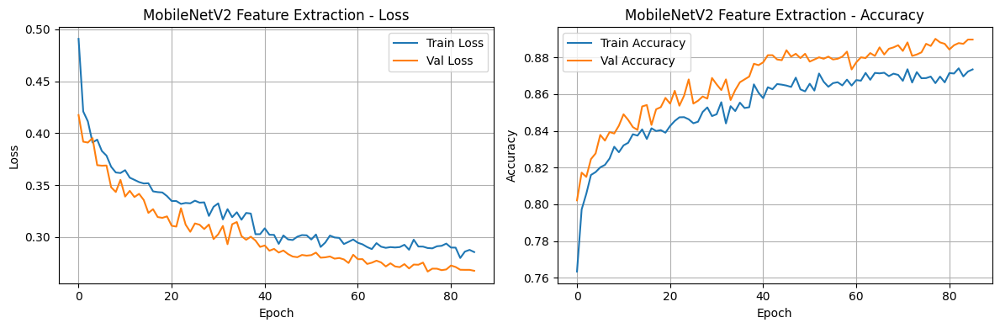

In [ ]:
# visualizing the feature extraction results
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history_mobile_feature.history['loss'], label='Train Loss')
plt.plot(history_mobile_feature.history['val_loss'], label='Val Loss')
plt.title('MobileNetV2 Feature Extraction - Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history_mobile_feature.history['accuracy'], label='Train Accuracy')  # исправлено
plt.plot(history_mobile_feature.history['val_accuracy'], label='Val Accuracy')
plt.title('MobileNetV2 Feature Extraction - Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
# fine-tuning (unfreezing the final 25% of layers)
base_model = mobile_model.layers[0]

total_layers = len(base_model.layers)
fine_tune_at = int(total_layers * 0.75)

for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False
for layer in base_model.layers[fine_tune_at:]:
  layer.trainable = True

for layer in base_model.layers[fine_tune_at:]:
  if isinstance(layer, tf.keras.layers.BatchNormalization):
    layer.trainable = False

mobile_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='binary_crossentropy',
    metrics=['accuracy',
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall'),
             tf.keras.metrics.AUC(name='auc')]
)

trainable_count = np.sum([tf.keras.backend.count_params(w) for w in mobile_model.trainable_weights])
non_trainable_count = np.sum([tf.keras.backend.count_params(w) for w in mobile_model.non_trainable_weights])
print(f'Total parameters: {trainable_count + non_trainable_count:,}')

mobile_finetune_callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=8,
        restore_best_weights=True,
        verbose=1
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=3,
        min_lr=1e-7,
        verbose=1
    ),
    tf.keras.callbacks.TensorBoard(
        log_dir='logs/mobilenet_finetune',
        histogram_freq=1
    ),
    tf.keras.callbacks.ModelCheckpoint(
        'mobile_finetune_best.h5',
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    )
]

history_mobile_finetune = mobile_model.fit(
    train_ds,
    epochs=50,
    validation_data=val_ds,
    callbacks=mobile_finetune_callbacks,
    verbose=1
)

full_history_mobile = {
    'feature': history_mobile_feature.history,
    'finetune': history_mobile_finetune.history
}

with open('mobile_full_history.pkl', 'wb') as f:
  pickle.dump(full_history_mobile, f)

mobile_model.save('mobile_final_model.h5')

Total parameters: 2,422,081
Epoch 1/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - accuracy: 0.8532 - auc: 0.9367 - loss: 0.3167 - precision: 0.8261 - recall: 0.8921
Epoch 1: val_loss improved from inf to 0.27657, saving model to mobile_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 75s 157ms/step - accuracy: 0.8533 - auc: 0.9367 - loss: 0.3167 - precision: 0.8261 - recall: 0.8921 - val_accuracy: 0.8823 - val_auc: 0.9544 - val_loss: 0.2766 - val_precision: 0.8735 - val_recall: 0.8861 - learning_rate: 1.0000e-05
Epoch 2/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8599 - auc: 0.9385 - loss: 0.3140 - precision: 0.8326 - recall: 0.8988
Epoch 2: val_loss improved from 0.27657 to 0.26541, saving model to mobile_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8599 - auc: 0.9386 - loss: 0.3139 - precision: 0.8326 - recall: 0.8988 - val_accuracy: 0.8881 - val_auc: 0.9576 - val_loss: 0.2654 - val_precision: 0.8833 - val_recall: 0.8869 - learning_rate: 1.0000e-05
Epoch 3/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8661 - auc: 0.9445 - loss: 0.3001 - precision: 0.8410 - recall: 0.9005
Epoch 3: val_loss did not improve from 0.26541
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8662 - auc: 0.9445 - loss: 0.3001 - precision: 0.8410 - recall: 0.9005 - val_accuracy: 0.8842 - val_auc: 0.9583 - val_loss: 0.2671 - val_precision: 0.8717 - val_recall: 0.8932 - learning_rate: 1.0000e-05
Epoch 4/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8707 - auc: 0.9489 - loss: 0.2909 - precision: 0.8431 - recall: 0.9079
Epoch 4: val_loss did not improve from 0.26541
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8707 - auc: 0.9489 - loss: 0.2909 - precision: 0

377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.8708 - auc: 0.9470 - loss: 0.2931 - precision: 0.8460 - recall: 0.9041 - val_accuracy: 0.8943 - val_auc: 0.9619 - val_loss: 0.2544 - val_precision: 0.9011 - val_recall: 0.8789 - learning_rate: 1.0000e-05
Epoch 6/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8773 - auc: 0.9520 - loss: 0.2782 - precision: 0.8537 - recall: 0.9085
Epoch 6: val_loss did not improve from 0.25443
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step - accuracy: 0.8773 - auc: 0.9520 - loss: 0.2781 - precision: 0.8537 - recall: 0.9085 - val_accuracy: 0.8939 - val_auc: 0.9610 - val_loss: 0.2571 - val_precision: 0.8915 - val_recall: 0.8900 - learning_rate: 1.0000e-05
Epoch 7/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8723 - auc: 0.9513 - loss: 0.2797 - precision: 0.8473 - recall: 0.9057
Epoch 7: val_loss improved from 0.25443 to 0.24024, saving model to mobile_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8723 - auc: 0.9513 - loss: 0.2797 - precision: 0.8473 - recall: 0.9057 - val_accuracy: 0.8970 - val_auc: 0.9660 - val_loss: 0.2402 - val_precision: 0.8998 - val_recall: 0.8869 - learning_rate: 1.0000e-05
Epoch 8/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8819 - auc: 0.9580 - loss: 0.2601 - precision: 0.8578 - recall: 0.9133
Epoch 8: val_loss improved from 0.24024 to 0.23769, saving model to mobile_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8819 - auc: 0.9580 - loss: 0.2601 - precision: 0.8578 - recall: 0.9133 - val_accuracy: 0.8982 - val_auc: 0.9671 - val_loss: 0.2377 - val_precision: 0.9039 - val_recall: 0.8845 - learning_rate: 1.0000e-05
Epoch 9/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8821 - auc: 0.9562 - loss: 0.2649 - precision: 0.8628 - recall: 0.9066
Epoch 9: val_loss did not improve from 0.23769
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8821 - auc: 0.9562 - loss: 0.2649 - precision: 0.8628 - recall: 0.9066 - val_accuracy: 0.8928 - val_auc: 0.9647 - val_loss: 0.2438 - val_precision: 0.9068 - val_recall: 0.8685 - learning_rate: 1.0000e-05
Epoch 10/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.8887 - auc: 0.9619 - loss: 0.2490 - precision: 0.8640 - recall: 0.9204
Epoch 10: val_loss improved from 0.23769 to 0.23106, saving model to mobile_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - accuracy: 0.8887 - auc: 0.9619 - loss: 0.2490 - precision: 0.8640 - recall: 0.9203 - val_accuracy: 0.9024 - val_auc: 0.9696 - val_loss: 0.2311 - val_precision: 0.9155 - val_recall: 0.8805 - learning_rate: 1.0000e-05
Epoch 11/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8865 - auc: 0.9589 - loss: 0.2599 - precision: 0.8640 - recall: 0.9150
Epoch 11: val_loss did not improve from 0.23106
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8864 - auc: 0.9589 - loss: 0.2599 - precision: 0.8639 - recall: 0.9150 - val_accuracy: 0.9005 - val_auc: 0.9649 - val_loss: 0.2412 - val_precision: 0.8905 - val_recall: 0.9068 - learning_rate: 1.0000e-05
Epoch 12/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8869 - auc: 0.9622 - loss: 0.2482 - precision: 0.8652 - recall: 0.9144
Epoch 12: val_loss improved from 0.23106 to 0.22128, saving model to mobile_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.8869 - auc: 0.9622 - loss: 0.2482 - precision: 0.8652 - recall: 0.9144 - val_accuracy: 0.9067 - val_auc: 0.9717 - val_loss: 0.2213 - val_precision: 0.9109 - val_recall: 0.8956 - learning_rate: 1.0000e-05
Epoch 13/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8887 - auc: 0.9622 - loss: 0.2468 - precision: 0.8687 - recall: 0.9137
Epoch 13: val_loss did not improve from 0.22128
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.8888 - auc: 0.9622 - loss: 0.2468 - precision: 0.8687 - recall: 0.9137 - val_accuracy: 0.8966 - val_auc: 0.9680 - val_loss: 0.2306 - val_precision: 0.8884 - val_recall: 0.9004 - learning_rate: 1.0000e-05
Epoch 14/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.8899 - auc: 0.9620 - loss: 0.2459 - precision: 0.8640 - recall: 0.9231
Epoch 14: val_loss improved from 0.22128 to 0.21590, saving model to mobile_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - accuracy: 0.8899 - auc: 0.9620 - loss: 0.2459 - precision: 0.8640 - recall: 0.9230 - val_accuracy: 0.9021 - val_auc: 0.9727 - val_loss: 0.2159 - val_precision: 0.9100 - val_recall: 0.8861 - learning_rate: 1.0000e-05
Epoch 15/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.8967 - auc: 0.9660 - loss: 0.2341 - precision: 0.8749 - recall: 0.9238
Epoch 15: val_loss did not improve from 0.21590
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.8967 - auc: 0.9660 - loss: 0.2341 - precision: 0.8749 - recall: 0.9238 - val_accuracy: 0.9032 - val_auc: 0.9694 - val_loss: 0.2273 - val_precision: 0.8966 - val_recall: 0.9052 - learning_rate: 1.0000e-05
Epoch 16/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.8974 - auc: 0.9647 - loss: 0.2417 - precision: 0.8730 - recall: 0.9280
Epoch 16: val_loss improved from 0.21590 to 0.20455, saving model to mobile_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 41s 108ms/step - accuracy: 0.8974 - auc: 0.9647 - loss: 0.2416 - precision: 0.8730 - recall: 0.9279 - val_accuracy: 0.9137 - val_auc: 0.9766 - val_loss: 0.2046 - val_precision: 0.9155 - val_recall: 0.9060 - learning_rate: 1.0000e-05
Epoch 17/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.8997 - auc: 0.9685 - loss: 0.2258 - precision: 0.8787 - recall: 0.9252
Epoch 17: val_loss did not improve from 0.20455
377/377 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - accuracy: 0.8997 - auc: 0.9685 - loss: 0.2258 - precision: 0.8787 - recall: 0.9252 - val_accuracy: 0.9048 - val_auc: 0.9723 - val_loss: 0.2124 - val_precision: 0.8854 - val_recall: 0.9235 - learning_rate: 1.0000e-05
Epoch 18/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8976 - auc: 0.9662 - loss: 0.2337 - precision: 0.8786 - recall: 0.9207
Epoch 18: val_loss did not improve from 0.20455
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.8976 - auc: 0.9662 - loss: 0.2337 - precisio

377/377 ━━━━━━━━━━━━━━━━━━━━ 41s 108ms/step - accuracy: 0.9054 - auc: 0.9703 - loss: 0.2192 - precision: 0.8846 - recall: 0.9304 - val_accuracy: 0.9125 - val_auc: 0.9760 - val_loss: 0.2036 - val_precision: 0.9320 - val_recall: 0.8845 - learning_rate: 2.0000e-06
Epoch 21/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.9082 - auc: 0.9740 - loss: 0.2057 - precision: 0.8892 - recall: 0.9310
Epoch 21: val_loss improved from 0.20364 to 0.20271, saving model to mobile_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 41s 108ms/step - accuracy: 0.9082 - auc: 0.9740 - loss: 0.2057 - precision: 0.8892 - recall: 0.9310 - val_accuracy: 0.9117 - val_auc: 0.9769 - val_loss: 0.2027 - val_precision: 0.9312 - val_recall: 0.8837 - learning_rate: 2.0000e-06
Epoch 22/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9170 - auc: 0.9767 - loss: 0.1959 - precision: 0.9012 - recall: 0.9349
Epoch 22: val_loss improved from 0.20271 to 0.19694, saving model to mobile_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - accuracy: 0.9170 - auc: 0.9767 - loss: 0.1959 - precision: 0.9012 - recall: 0.9349 - val_accuracy: 0.9152 - val_auc: 0.9776 - val_loss: 0.1969 - val_precision: 0.9317 - val_recall: 0.8908 - learning_rate: 2.0000e-06
Epoch 23/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9116 - auc: 0.9765 - loss: 0.1955 - precision: 0.8948 - recall: 0.9311
Epoch 23: val_loss improved from 0.19694 to 0.19576, saving model to mobile_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - accuracy: 0.9116 - auc: 0.9765 - loss: 0.1955 - precision: 0.8948 - recall: 0.9311 - val_accuracy: 0.9187 - val_auc: 0.9775 - val_loss: 0.1958 - val_precision: 0.9286 - val_recall: 0.9020 - learning_rate: 2.0000e-06
Epoch 24/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9132 - auc: 0.9762 - loss: 0.1981 - precision: 0.8883 - recall: 0.9437
Epoch 24: val_loss improved from 0.19576 to 0.18998, saving model to mobile_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.9132 - auc: 0.9762 - loss: 0.1981 - precision: 0.8883 - recall: 0.9437 - val_accuracy: 0.9160 - val_auc: 0.9783 - val_loss: 0.1900 - val_precision: 0.9247 - val_recall: 0.9004 - learning_rate: 2.0000e-06
Epoch 25/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9131 - auc: 0.9756 - loss: 0.1987 - precision: 0.8962 - recall: 0.9328
Epoch 25: val_loss did not improve from 0.18998
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.9131 - auc: 0.9756 - loss: 0.1987 - precision: 0.8962 - recall: 0.9328 - val_accuracy: 0.9183 - val_auc: 0.9781 - val_loss: 0.1910 - val_precision: 0.9272 - val_recall: 0.9028 - learning_rate: 2.0000e-06
Epoch 26/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9130 - auc: 0.9746 - loss: 0.2032 - precision: 0.8971 - recall: 0.9318
Epoch 26: val_loss improved from 0.18998 to 0.18956, saving model to mobile_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.9130 - auc: 0.9746 - loss: 0.2032 - precision: 0.8971 - recall: 0.9317 - val_accuracy: 0.9175 - val_auc: 0.9783 - val_loss: 0.1896 - val_precision: 0.9270 - val_recall: 0.9012 - learning_rate: 2.0000e-06
Epoch 27/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9119 - auc: 0.9755 - loss: 0.2000 - precision: 0.8921 - recall: 0.9355
Epoch 27: val_loss improved from 0.18956 to 0.18949, saving model to mobile_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.9119 - auc: 0.9755 - loss: 0.1999 - precision: 0.8921 - recall: 0.9355 - val_accuracy: 0.9175 - val_auc: 0.9785 - val_loss: 0.1895 - val_precision: 0.9264 - val_recall: 0.9020 - learning_rate: 2.0000e-06
Epoch 28/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9149 - auc: 0.9760 - loss: 0.1980 - precision: 0.8916 - recall: 0.9431
Epoch 28: val_loss did not improve from 0.18949
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.9149 - auc: 0.9760 - loss: 0.1980 - precision: 0.8916 - recall: 0.9430 - val_accuracy: 0.9160 - val_auc: 0.9784 - val_loss: 0.1921 - val_precision: 0.9282 - val_recall: 0.8964 - learning_rate: 2.0000e-06
Epoch 29/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9120 - auc: 0.9758 - loss: 0.1984 - precision: 0.8950 - recall: 0.9322
Epoch 29: ReduceLROnPlateau reducing learning rate to 3.999999989900971e-07.

Epoch 29: val_loss did not improve from 0.18949
377/377 ━━━━━━━━━━━━━━━━

377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.9189 - auc: 0.9787 - loss: 0.1866 - precision: 0.9030 - recall: 0.9372 - val_accuracy: 0.9241 - val_auc: 0.9791 - val_loss: 0.1862 - val_precision: 0.9301 - val_recall: 0.9124 - learning_rate: 4.0000e-07
Epoch 31/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9129 - auc: 0.9762 - loss: 0.1980 - precision: 0.8935 - recall: 0.9358
Epoch 31: val_loss improved from 0.18618 to 0.18442, saving model to mobile_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 41s 108ms/step - accuracy: 0.9129 - auc: 0.9762 - loss: 0.1980 - precision: 0.8935 - recall: 0.9358 - val_accuracy: 0.9237 - val_auc: 0.9794 - val_loss: 0.1844 - val_precision: 0.9266 - val_recall: 0.9155 - learning_rate: 4.0000e-07
Epoch 32/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9205 - auc: 0.9782 - loss: 0.1887 - precision: 0.8995 - recall: 0.9455
Epoch 32: val_loss did not improve from 0.18442
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.9205 - auc: 0.9782 - loss: 0.1887 - precision: 0.8995 - recall: 0.9455 - val_accuracy: 0.9241 - val_auc: 0.9788 - val_loss: 0.1866 - val_precision: 0.9281 - val_recall: 0.9147 - learning_rate: 4.0000e-07
Epoch 33/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9154 - auc: 0.9779 - loss: 0.1894 - precision: 0.8956 - recall: 0.9391
Epoch 33: val_loss did not improve from 0.18442
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.9154 - auc: 0.9779 - loss: 0.1894 - precisio

377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.9174 - auc: 0.9784 - loss: 0.1885 - precision: 0.8989 - recall: 0.9390 - val_accuracy: 0.9202 - val_auc: 0.9796 - val_loss: 0.1839 - val_precision: 0.9261 - val_recall: 0.9084 - learning_rate: 1.0000e-07
Epoch 39/50
377/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9201 - auc: 0.9783 - loss: 0.1886 - precision: 0.9040 - recall: 0.9388
Epoch 39: val_loss did not improve from 0.18395
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.9201 - auc: 0.9783 - loss: 0.1885 - precision: 0.9040 - recall: 0.9388 - val_accuracy: 0.9218 - val_auc: 0.9793 - val_loss: 0.1855 - val_precision: 0.9312 - val_recall: 0.9060 - learning_rate: 1.0000e-07
Epoch 40/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9181 - auc: 0.9781 - loss: 0.1886 - precision: 0.9035 - recall: 0.9346
Epoch 40: val_loss did not improve from 0.18395
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.9181 - auc: 0.9781 - loss: 0.1885 - precisio

377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.9160 - auc: 0.9794 - loss: 0.1835 - precision: 0.8984 - recall: 0.9368 - val_accuracy: 0.9218 - val_auc: 0.9794 - val_loss: 0.1839 - val_precision: 0.9284 - val_recall: 0.9092 - learning_rate: 1.0000e-07
Epoch 46/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9165 - auc: 0.9780 - loss: 0.1886 - precision: 0.8987 - recall: 0.9374
Epoch 46: val_loss did not improve from 0.18385
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.9165 - auc: 0.9780 - loss: 0.1886 - precision: 0.8987 - recall: 0.9374 - val_accuracy: 0.9210 - val_auc: 0.9795 - val_loss: 0.1840 - val_precision: 0.9290 - val_recall: 0.9068 - learning_rate: 1.0000e-07
Epoch 47/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9240 - auc: 0.9811 - loss: 0.1787 - precision: 0.9108 - recall: 0.9383
Epoch 47: val_loss did not improve from 0.18385
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.9239 - auc: 0.9811 - loss: 0.1787 - precisio

377/377 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - accuracy: 0.9143 - auc: 0.9788 - loss: 0.1841 - precision: 0.8990 - recall: 0.9319 - val_accuracy: 0.9218 - val_auc: 0.9795 - val_loss: 0.1836 - val_precision: 0.9284 - val_recall: 0.9092 - learning_rate: 1.0000e-07
Epoch 49/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9235 - auc: 0.9794 - loss: 0.1833 - precision: 0.9068 - recall: 0.9426
Epoch 49: val_loss improved from 0.18363 to 0.18356, saving model to mobile_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.9235 - auc: 0.9794 - loss: 0.1833 - precision: 0.9068 - recall: 0.9426 - val_accuracy: 0.9226 - val_auc: 0.9796 - val_loss: 0.1836 - val_precision: 0.9285 - val_recall: 0.9108 - learning_rate: 1.0000e-07
Epoch 50/50
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9169 - auc: 0.9793 - loss: 0.1840 - precision: 0.9012 - recall: 0.9352
Epoch 50: val_loss did not improve from 0.18356
377/377 ━━━━━━━━━━━━━━━━━━━━ 40s 106ms/step - accuracy: 0.9169 - auc: 0.9793 - loss: 0.1840 - precision: 0.9012 - recall: 0.9352 - val_accuracy: 0.9226 - val_auc: 0.9796 - val_loss: 0.1840 - val_precision: 0.9306 - val_recall: 0.9084 - learning_rate: 1.0000e-07
Restoring model weights from the end of the best epoch: 49.


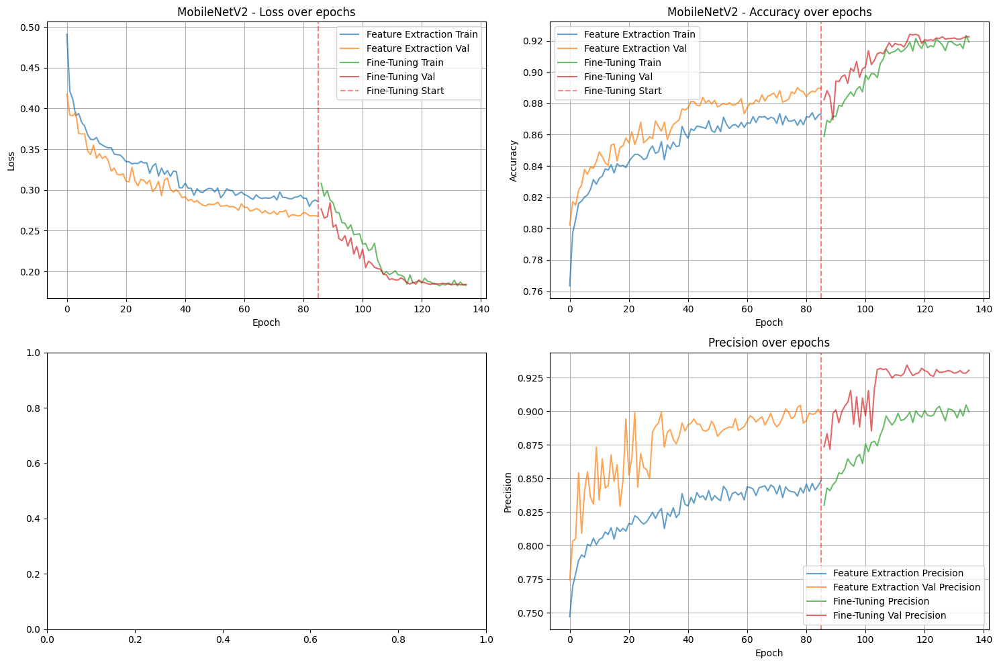

In [ ]:
# visualize the full learning curves
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Loss
axes[0, 0].plot(history_mobile_feature.history['loss'], label='Feature Extraction Train', alpha=0.7)
axes[0, 0].plot(history_mobile_feature.history['val_loss'], label='Feature Extraction Val', alpha=0.7)
axes[0, 0].plot(range(len(history_mobile_feature.history['loss']), len(history_mobile_feature.history['loss']) + len(history_mobile_finetune.history['loss'])), history_mobile_finetune.history['loss'], label='Fine-Tuning Train', alpha=0.7)
axes[0, 0].plot(range(len(history_mobile_feature.history['val_loss']), len(history_mobile_feature.history['val_loss']) + len(history_mobile_finetune.history['val_loss'])), history_mobile_finetune.history['val_loss'], label='Fine-Tuning Val', alpha=0.7)
axes[0, 0].axvline(x=len(history_mobile_feature.history['loss'])-1, color='r', linestyle='--', alpha=0.5, label='Fine-Tuning Start')
axes[0, 0].set_title('MobileNetV2 - Loss over epochs')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].legend()
axes[0, 0].grid(True)

# accuracy
axes[0, 1].plot(history_mobile_feature.history['accuracy'], label='Feature Extraction Train', alpha=0.7)
axes[0, 1].plot(history_mobile_feature.history['val_accuracy'], label='Feature Extraction Val', alpha=0.7)
axes[0, 1].plot(range(len(history_mobile_feature.history['accuracy']), len(history_mobile_feature.history['accuracy']) + len(history_mobile_finetune.history['accuracy'])), history_mobile_finetune.history['accuracy'], label='Fine-Tuning Train', alpha=0.7)
axes[0, 1].plot(range(len(history_mobile_feature.history['val_accuracy']), len(history_mobile_feature.history['val_accuracy']) + len(history_mobile_finetune.history['val_accuracy'])), history_mobile_finetune.history['val_accuracy'], label='Fine-Tuning Val', alpha=0.7)
axes[0, 1].axvline(x=len(history_mobile_feature.history['accuracy'])-1, color='r', linestyle='--', alpha=0.5, label='Fine-Tuning Start')
axes[0, 1].set_title('MobileNetV2 - Accuracy over epochs')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Accuracy')
axes[0, 1].legend()
axes[0, 1].grid(True)

# learning rate
if 'lr' in history_mobile_feature.history:
  axes[1, 0].plot(history_mobile_feature.history['lr'], label='Feature Extraction LR')
  axes[1, 0].plot(range(len(history_mobile_feature.history['lr']), len(history_mobile_feature.history['lr']) + len(history_mobile_finetune.history['lr'])), history_mobile_finetune.history['lr'], label='Fine-Tuning LR')
  axes[1, 0].axvline(x=len(history_mobile_feature.history['lr'])-1, color='r', linestyle='--', alpha=0.5, label='Fine-Tuning Start')
  axes[1, 0].set_title('Learning rate over epochs')
  axes[1, 0].set_xlabel('Epoch')
  axes[1, 0].set_ylabel('Learning Rate')
  axes[1, 0].legend()
  axes[1, 0].grid(True)
  axes[1, 0].set_yscale('log')

# Precision
axes[1, 1].plot(history_mobile_feature.history['precision'], label='Feature Extraction Precision', alpha=0.7)
axes[1, 1].plot(history_mobile_feature.history['val_precision'], label='Feature Extraction Val Precision', alpha=0.7)
axes[1, 1].plot(range(len(history_mobile_feature.history['precision']),
                      len(history_mobile_feature.history['precision']) + len(history_mobile_finetune.history['precision'])),
                 history_mobile_finetune.history['precision'], label='Fine-Tuning Precision', alpha=0.7)
axes[1, 1].plot(range(len(history_mobile_feature.history['val_precision']),
                      len(history_mobile_feature.history['val_precision']) + len(history_mobile_finetune.history['val_precision'])),
                 history_mobile_finetune.history['val_precision'], label='Fine-Tuning Val Precision', alpha=0.7)
axes[1, 1].axvline(x=len(history_mobile_feature.history['precision'])-1, color='r', linestyle='--', alpha=0.5)
axes[1, 1].set_title('Precision over epochs')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Precision')
axes[1, 1].legend()
axes[1, 1].grid(True)

plt.tight_layout()
plt.show()

EfficientNetB0 selected as the third model for transfer learning

In [ ]:
# creatinig the EfficientNetB0 base model
base_model = EfficientNetB0(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)

# freezing all layers of the base model
base_model.trainable = False

# creating the full model
efficient_model = models.Sequential([
    base_model,
    layers.Dropout(0.3, name='dropout_1'),
    layers.Dense(128, activation='relu', name='dense_128'),
    layers.Dropout(0.5, name='dropout_2'),
    layers.Dense(1, activation='sigmoid', name='output')
])

trainable_count = np.sum([tf.keras.backend.count_params(w) for w in efficient_model.trainable_weights])
non_trainable_count = np.sum([tf.keras.backend.count_params(w) for w in efficient_model.non_trainable_weights])
print(f'Total parameters: {trainable_count + non_trainable_count}')
print(f'Total layers: {len(base_model.layers)}')

efficient_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='binary_crossentropy',
    metrics=['accuracy',
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall'),
             tf.keras.metrics.AUC(name='auc')
             ]
)

efficient_callbacks_stage1 = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True,
        verbose=1,
        mode='min'
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=5,
        min_lr=1e-6,
        verbose=1,
        mode='min'
    ),
    tf.keras.callbacks.ModelCheckpoint(
        'efficientnet_feature_best.h5',
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=False,
        verbose=1
    )
]

history_efficient_feature = efficient_model.fit(
    train_ds,
    epochs=30,
    validation_data=val_ds,
    callbacks=efficient_callbacks_stage1,
    verbose=1
)

with open('efficient_feature_history.pkl', 'wb') as f:
  pickle.dump(history_efficient_feature.history, f)

Total parameters: 4213668.0
Total layers: 239
Epoch 1/30
377/377 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - accuracy: 0.4995 - auc: 0.4965 - loss: 0.7069 - precision: 0.4918 - recall: 0.3802
Epoch 1: val_loss improved from inf to 0.69294, saving model to efficientnet_feature_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 81s 160ms/step - accuracy: 0.4996 - auc: 0.4966 - loss: 0.7069 - precision: 0.4918 - recall: 0.3797 - val_accuracy: 0.5141 - val_auc: 0.5000 - val_loss: 0.6929 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 0.0010
Epoch 2/30
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5053 - auc: 0.5002 - loss: 0.6934 - precision: 0.4858 - recall: 0.1593
Epoch 2: val_loss improved from 0.69294 to 0.69288, saving model to efficientnet_feature_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - accuracy: 0.5054 - auc: 0.5002 - loss: 0.6933 - precision: 0.4859 - recall: 0.1589 - val_accuracy: 0.5141 - val_auc: 0.5000 - val_loss: 0.6929 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 0.0010
Epoch 3/30
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.5119 - auc: 0.5080 - loss: 0.6930 - precision: 0.5287 - recall: 0.1355
Epoch 3: val_loss improved from 0.69288 to 0.69275, saving model to efficientnet_feature_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - accuracy: 0.5119 - auc: 0.5079 - loss: 0.6930 - precision: 0.5287 - recall: 0.1350 - val_accuracy: 0.5141 - val_auc: 0.5000 - val_loss: 0.6927 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 0.0010
Epoch 4/30
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5038 - auc: 0.4902 - loss: 0.6935 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 4: val_loss improved from 0.69275 to 0.69275, saving model to efficientnet_feature_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - accuracy: 0.5038 - auc: 0.4902 - loss: 0.6934 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.5141 - val_auc: 0.5000 - val_loss: 0.6927 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 0.0010
Epoch 5/30
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5038 - auc: 0.4914 - loss: 0.6933 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 5: val_loss did not improve from 0.69275
377/377 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.5038 - auc: 0.4914 - loss: 0.6933 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.5141 - val_auc: 0.5000 - val_loss: 0.6927 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 0.0010
Epoch 6/30
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5038 - auc: 0.4889 - loss: 0.6934 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 6: val_loss did not improve from 0.69275
377/377 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - accuracy: 0.5038 - a

`model.compile()`, this method configures the training process, defining how the model learns, how it is penalized for errors, and how success is measured.

- optimizer - how the model learns. Adam is an advanced version of stochastic gradient descent;
- loss is a penalty for errors. `binary_crossentropy` used for binary classification;
- metrics is a monitoring progress:
  - accuracy is the proportion of correct predictions;
  - precision is a reliability of all cases labeled as "class 1", how many were actually class 1 (**measures false positives**);
  - recall is a sensitivity of all actual class 1 cases, how many did the model find (**measures false negatives**);
  - AUC is the general ability to distinguish (differentiate) between classes.

Why use precision and recall together? Only together do they provide an honest performance overview.

---
Callbacks are "observers" that intervene in the training process based on specific schedules.

`EarlyStopping` is stopping when improvement stalls. If the model stops learning, there is no need to waste resources. Model wait for 10 epochs; if there is no progress, training terminates, and the weights from the best_performing epoch are restored.

`ReduceLROnPlateau` is shrinking the step size if stuck. If the model is stuck in a local minimum, we reduce the step size fivefold to help it navigate toward the global optimum more precisely.

`ModelChackpoint` is automatic saving. Every time the `val_loss` improves, the model is saved to a file.

___
**An epoch** is one complete pass of the entire training dataset through the neural network.


In [ ]:
# fine-tuning (unfreezing 25% of layers)
base_model = efficient_model.layers[0]

total_layers = len(base_model.layers)
fine_tune_at = int(total_layers * 0.75)

# freezing the first 75% of layers
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

# unfreezing the last 25% of layers
for layer in base_model.layers[fine_tune_at:]:
  layer.trainable = True
  if isinstance(layer, tf.keras.layers.BatchNormalization):
    layer.trainable = False

efficient_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='binary_crossentropy',
    metrics=[
        'accuracy',
        tf.keras.metrics.Precision(name='precision'),
        tf.keras.metrics.Recall(name='recall'),
        tf.keras.metrics.AUC(name='auc')
    ]
)

efficient_callbacks_stage2 = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=8,
        restore_best_weights=True,
        verbose=1,
        mode='min'
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=3,
        min_lr=1e-7,
        verbose=1,
        mode='min'
    ),
    tf.keras.callbacks.ModelCheckpoint(
        'efficientnet_finetune_best.h5',
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=False,
        verbose=1
    )
]

# training (fine-tuning)
initial_epoch = history_efficient_feature.epoch[-1] + 1 if history_efficient_feature.epoch else 0

history_efficient_finetune = efficient_model.fit(
    train_ds,
    epochs=initial_epoch + 30,
    initial_epoch=initial_epoch,
    validation_data=val_ds,
    callbacks=efficient_callbacks_stage2,
    verbose=1
)

full_history_efficient = {
    'feature': history_efficient_feature.history,
    'finetune': history_efficient_finetune.history
}

with open('efficient_full_history.pkl', 'wb') as f:
  pickle.dump(full_history_efficient, f)

efficient_model.save('efficientnet_final_model.h5')

Epoch 15/44
377/377 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - accuracy: 0.5037 - auc: 0.5001 - loss: 0.6933 - precision: 0.0450 - recall: 1.5127e-04
Epoch 15: val_loss improved from inf to 0.69275, saving model to efficientnet_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 92s 174ms/step - accuracy: 0.5037 - auc: 0.5001 - loss: 0.6933 - precision: 0.0460 - recall: 1.5539e-04 - val_accuracy: 0.5141 - val_auc: 0.5000 - val_loss: 0.6927 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-05
Epoch 16/44
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.5036 - auc: 0.4999 - loss: 0.6934 - precision: 0.1924 - recall: 0.0011
Epoch 16: val_loss improved from 0.69275 to 0.69274, saving model to efficientnet_finetune_best.h5


377/377 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - accuracy: 0.5036 - auc: 0.4999 - loss: 0.6934 - precision: 0.1938 - recall: 0.0012 - val_accuracy: 0.5141 - val_auc: 0.5000 - val_loss: 0.6927 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-05
Epoch 17/44
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.5036 - auc: 0.5047 - loss: 0.6934 - precision: 0.4920 - recall: 0.0257
Epoch 17: val_loss did not improve from 0.69274
377/377 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - accuracy: 0.5037 - auc: 0.5047 - loss: 0.6934 - precision: 0.4920 - recall: 0.0257 - val_accuracy: 0.5141 - val_auc: 0.5000 - val_loss: 0.6927 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-05
Epoch 18/44
376/377 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.5021 - auc: 0.5026 - loss: 0.6934 - precision: 0.4480 - recall: 0.0162
Epoch 18: ReduceLROnPlateau reducing learning rate to 1.9999999494757505e-06.

Epoch 18: val_loss did not improve from 0.69274
377/377

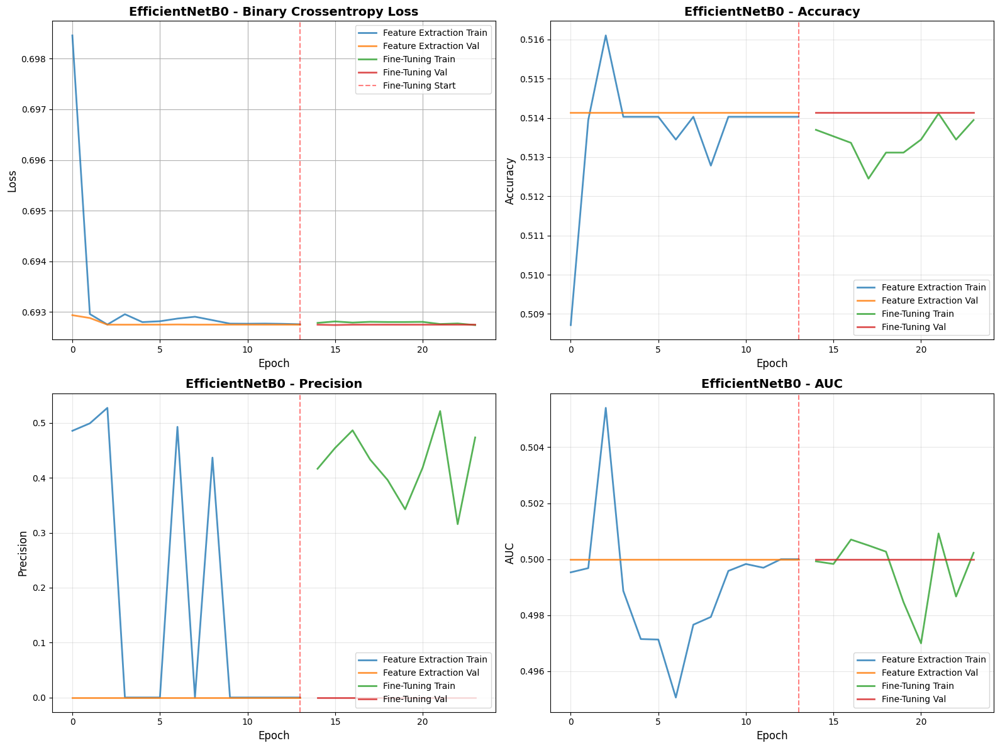

In [ ]:
# visualizing the results
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# loss
axes[0, 0].plot(history_efficient_feature.history['loss'], label='Feature Extraction Train', linewidth=2, alpha=0.8)
axes[0, 0].plot(history_efficient_feature.history['val_loss'], label='Feature Extraction Val', linewidth=2, alpha=0.8)
axes[0, 0].plot(range(len(history_efficient_feature.history['loss']), len(history_efficient_feature.history['loss']) + len(history_efficient_finetune.history['loss'])), history_efficient_finetune.history['loss'], label='Fine-Tuning Train', linewidth=2, alpha=0.8)
axes[0, 0].plot(range(len(history_efficient_feature.history['val_loss']), len(history_efficient_feature.history['val_loss']) + len(history_efficient_finetune.history['val_loss'])), history_efficient_finetune.history['val_loss'], label='Fine-Tuning Val', linewidth=2, alpha=0.8)
axes[0, 0].axvline(x=len(history_efficient_feature.history['loss'])-1, color='red', linestyle='--', alpha=0.5, label='Fine-Tuning Start')
axes[0, 0].set_title('EfficientNetB0 - Binary Crossentropy Loss', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Epoch', fontsize=12)
axes[0, 0].set_ylabel('Loss', fontsize=12)
axes[0, 0].legend(loc='upper right', fontsize=10)
axes[0, 0].grid(True)

# accuracy
axes[0, 1].plot(history_efficient_feature.history['accuracy'], label='Feature Extraction Train', linewidth=2, alpha=0.8)
axes[0, 1].plot(history_efficient_feature.history['val_accuracy'], label='Feature Extraction Val', linewidth=2, alpha=0.8)
axes[0, 1].plot(range(len(history_efficient_feature.history['accuracy']), len(history_efficient_feature.history['accuracy']) + len(history_efficient_finetune.history['accuracy'])), history_efficient_finetune.history['accuracy'], label='Fine-Tuning Train', linewidth=2, alpha=0.8)
axes[0, 1].plot(range(len(history_efficient_feature.history['val_accuracy']), len(history_efficient_feature.history['val_accuracy']) + len(history_efficient_finetune.history['val_accuracy'])), history_efficient_finetune.history['val_accuracy'], label='Fine-Tuning Val', linewidth=2, alpha=0.8)
axes[0, 1].axvline(x=len(history_efficient_feature.history['accuracy'])-1, color='red', linestyle='--', alpha=0.5)
axes[0, 1].set_title('EfficientNetB0 - Accuracy', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Epoch', fontsize=12)
axes[0, 1].set_ylabel('Accuracy', fontsize=12)
axes[0, 1].legend(loc='lower right', fontsize=10)
axes[0, 1].grid(True, alpha=0.3)

# precison
axes[1, 0].plot(history_efficient_feature.history['precision'], label='Feature Extraction Train', linewidth=2, alpha=0.8)
axes[1, 0].plot(history_efficient_feature.history['val_precision'], label='Feature Extraction Val', linewidth=2, alpha=0.8)
axes[1, 0].plot(range(len(history_efficient_feature.history['precision']), len(history_efficient_feature.history['precision']) + len(history_efficient_finetune.history['precision'])), history_efficient_finetune.history['precision'], label='Fine-Tuning Train', linewidth=2, alpha=0.8)
axes[1, 0].plot(range(len(history_efficient_feature.history['val_precision']),  len(history_efficient_feature.history['val_precision']) + len(history_efficient_finetune.history['val_precision'])), history_efficient_finetune.history['val_precision'], label='Fine-Tuning Val', linewidth=2, alpha=0.8)
axes[1, 0].axvline(x=len(history_efficient_feature.history['precision'])-1, color='red', linestyle='--', alpha=0.5)
axes[1, 0].set_title('EfficientNetB0 - Precision', fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('Epoch', fontsize=12)
axes[1, 0].set_ylabel('Precision', fontsize=12)
axes[1, 0].legend(loc='lower right', fontsize=10)
axes[1, 0].grid(True, alpha=0.3)

# AUC
axes[1, 1].plot(history_efficient_feature.history['auc'], label='Feature Extraction Train', linewidth=2, alpha=0.8)
axes[1, 1].plot(history_efficient_feature.history['val_auc'], label='Feature Extraction Val', linewidth=2, alpha=0.8)
axes[1, 1].plot(range(len(history_efficient_feature.history['auc']), len(history_efficient_feature.history['auc']) + len(history_efficient_finetune.history['auc'])), history_efficient_finetune.history['auc'], label='Fine-Tuning Train', linewidth=2, alpha=0.8)
axes[1, 1].plot(range(len(history_efficient_feature.history['val_auc']), len(history_efficient_feature.history['val_auc']) + len(history_efficient_finetune.history['val_auc'])), history_efficient_finetune.history['val_auc'], label='Fine-Tuning Val', linewidth=2, alpha=0.8)
axes[1, 1].axvline(x=len(history_efficient_feature.history['auc'])-1, color='red', linestyle='--', alpha=0.5)
axes[1, 1].set_title('EfficientNetB0 - AUC', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('Epoch', fontsize=12)
axes[1, 1].set_ylabel('AUC', fontsize=12)
axes[1, 1].legend(loc='lower right', fontsize=10)
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

FInal Evaluation on the Test Set


  📌 Scratch CNN:
     Accuracy: 0.8467
     Precision: 0.8237
     Recall: 0.8709
     F1-Score: 0.8466
     ROC-AUC: 0.9353

  📌 MobileNetV2:
     Accuracy: 0.9264
     Precision: 0.9376
     Recall: 0.9092
     F1-Score: 0.9231
     ROC-AUC: 0.9820

  📌 EfficientNetB0:
     Accuracy: 0.5141
     Precision: 0.0000
     Recall: 0.0000
     F1-Score: 0.0000
     ROC-AUC: 0.6760


,Model,Accuracy,Precision,Recall,F1-Score,AUC
0,Scratch CNN,0.846690,0.823662,0.870916,0.846631,0.935297
1,MobileNetV2,0.926442,0.937551,0.909163,0.923139,0.981997
2,EfficientNetB0,0.514131,0.000000,0.000000,0.000000,0.676021



 Scratch CNN:
              precision    recall  f1-score   support

     Class 0       0.87      0.82      0.85      1328
     Class 1       0.82      0.87      0.85      1255

    accuracy                           0.85      2583
   macro avg       0.85      0.85      0.85      2583
weighted avg       0.85      0.85      0.85      2583


 MobileNetV2:
              precision    recall  f1-score   support

     Class 0       0.92      0.94      0.93      1328
     Class 1       0.94      0.91      0.92      1255

    accuracy                           0.93      2583
   macro avg       0.93      0.93      0.93      2583
weighted avg       0.93      0.93      0.93      2583


 EfficientNetB0:
              precision    recall  f1-score   support

     Class 0       0.51      1.00      0.68      1328
     Class 1       0.00      0.00      0.00      1255

    accuracy                           0.51      2583
   macro avg       0.26      0.50      0.34      2583
weighted avg       0.26   

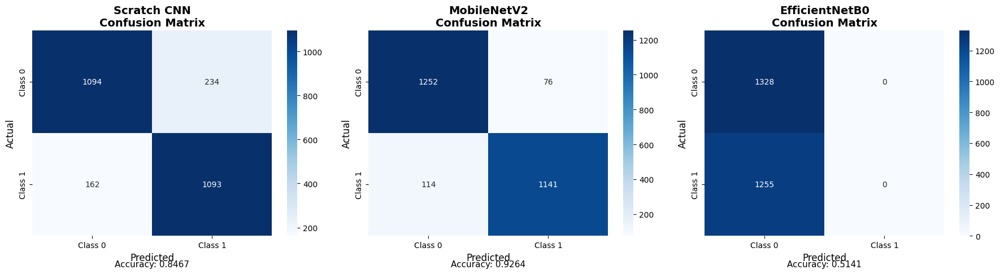

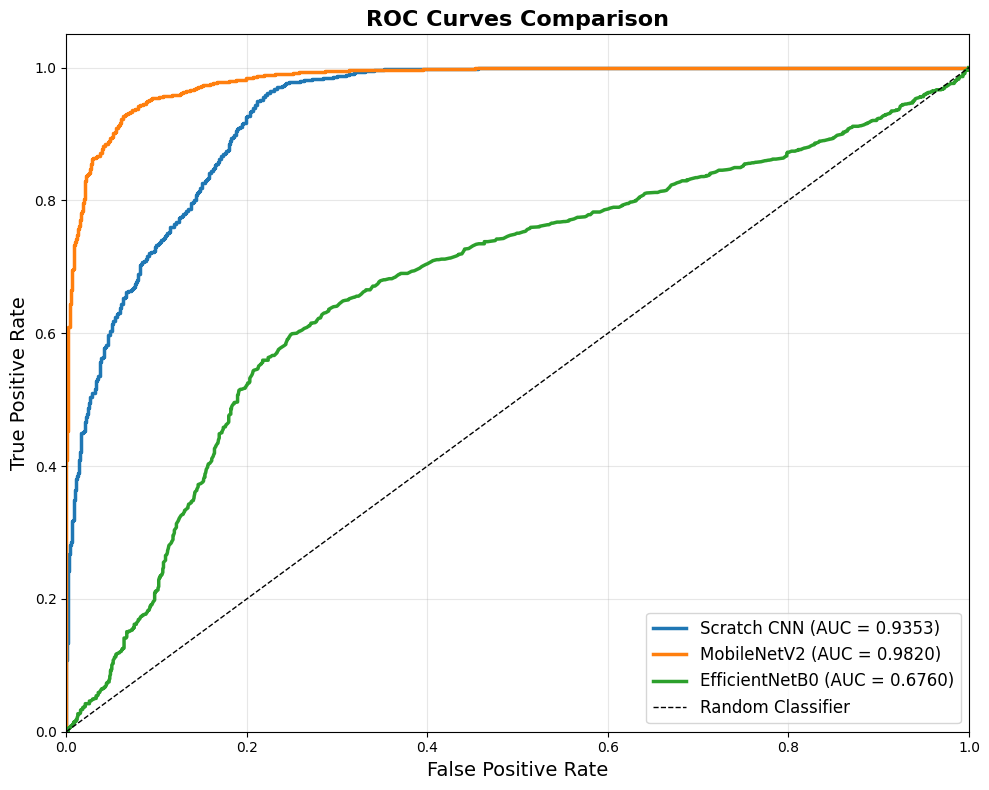

In [ ]:
# function for obtainning predictions
def get_predictions(model, dataset):
  y_true = []
  y_pred_proba = []

  for images, labels in dataset:
    preds = model.predict(images, verbose=0)
    y_pred_proba.extend(preds.flatten())
    y_true.extend(labels.numpy())

  y_true = np.array(y_true)
  y_pred_proba = np.array(y_pred_proba)
  y_pred = (y_pred_proba > 0.5).astype(int)

  return y_true, y_pred, y_pred_proba

# function for calculating metrics
def calculate_metrics(y_true, y_pred, y_pred_proba, model_name):
  metrics = {
      'Model': model_name,
      'Accuracy': accuracy_score(y_true, y_pred),
      'Precision': precision_score(y_true, y_pred, zero_division=0),
      'Recall': recall_score(y_true, y_pred, zero_division=0),
      'F1-Score': f1_score(y_true, y_pred, zero_division=0),
      'AUC': roc_auc_score(y_true, y_pred_proba)
  }

  return metrics

models = {}

# loading the scratch cnn
models['Scratch CNN'] = scratch_model

# loading the mobilenetv2
models['MobileNetV2'] = mobile_model

# loading the efficientnetb0
models['EfficientNetB0'] = efficient_model

# obtainning predictions for all models
results = {}
predictions = {}

for name, model in models.items():
    print(f"\n  📌 {name}:")
    y_true, y_pred, y_pred_proba = get_predictions(model, test_ds)
    predictions[name] = {
        'y_true': y_true,
        'y_pred': y_pred,
        'y_pred_proba': y_pred_proba
    }
    metrics = calculate_metrics(y_true, y_pred, y_pred_proba, name)
    results[name] = metrics
    print(f"     Accuracy: {metrics['Accuracy']:.4f}")
    print(f"     Precision: {metrics['Precision']:.4f}")
    print(f"     Recall: {metrics['Recall']:.4f}")
    print(f"     F1-Score: {metrics['F1-Score']:.4f}")
    print(f"     ROC-AUC: {metrics['AUC']:.4f}")


# comparative table
results_df = pd.DataFrame(list(results.values()))
results_df = results_df[['Model', 'Accuracy', 'Precision', 'Recall', 'F1-Score', 'AUC']]

def highlight_best(s):
    is_max = s == s.max()
    return ['background-color: #90EE90' if v else '' for v in is_max]

styled_results = results_df.style.apply(highlight_best, subset=['Accuracy', 'Precision', 'Recall', 'F1-Score', 'AUC'])
display(styled_results)

# classification reports

for name, preds in predictions.items():
  print(f'\n {name}:')
  print(classification_report(preds['y_true'], preds['y_pred'], target_names=['Class 0', 'Class 1']))

# confusion matrices
import seaborn as sns
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for idx, (name, preds) in enumerate(predictions.items()):
    cm = confusion_matrix(preds['y_true'], preds['y_pred'])

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[idx],
                xticklabels=['Class 0', 'Class 1'],
                yticklabels=['Class 0', 'Class 1'])
    axes[idx].set_title(f'{name}\nConfusion Matrix', fontsize=14, fontweight='bold')
    axes[idx].set_xlabel('Predicted', fontsize=12)
    axes[idx].set_ylabel('Actual', fontsize=12)

    # Добавляем метрики под матрицей
    acc = results[name]['Accuracy']
    axes[idx].text(0.5, -0.15, f'Accuracy: {acc:.4f}',
                   transform=axes[idx].transAxes, ha='center', fontsize=11)

plt.tight_layout()
plt.show()

# ROC curves
plt.figure(figsize=(10, 8))
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

for idx, (name, preds) in enumerate(predictions.items()):
    fpr, tpr, _ = roc_curve(preds['y_true'], preds['y_pred_proba'])
    auc = results[name]['AUC']

    plt.plot(fpr, tpr, color=colors[idx], lw=2.5,
             label=f'{name} (AUC = {auc:.4f})')

plt.plot([0, 1], [0, 1], 'k--', lw=1, label='Random Classifier')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('ROC Curves Comparison', fontsize=16, fontweight='bold')
plt.legend(loc='lower right', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# selecting the best model
best_model = results_df.loc[results_df['AUC'].idxmax()]

Gradient-weighted Class Activation Mapping

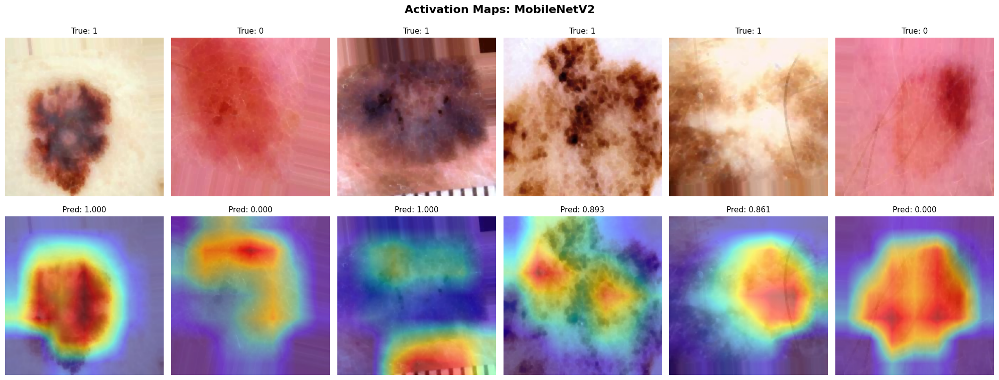

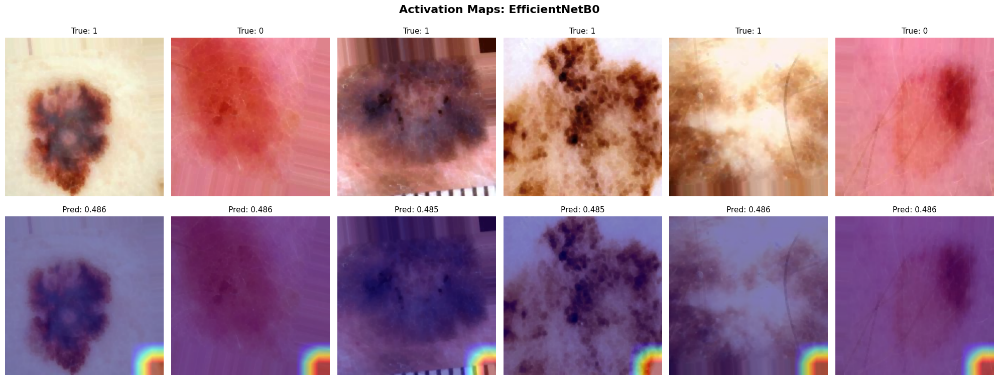

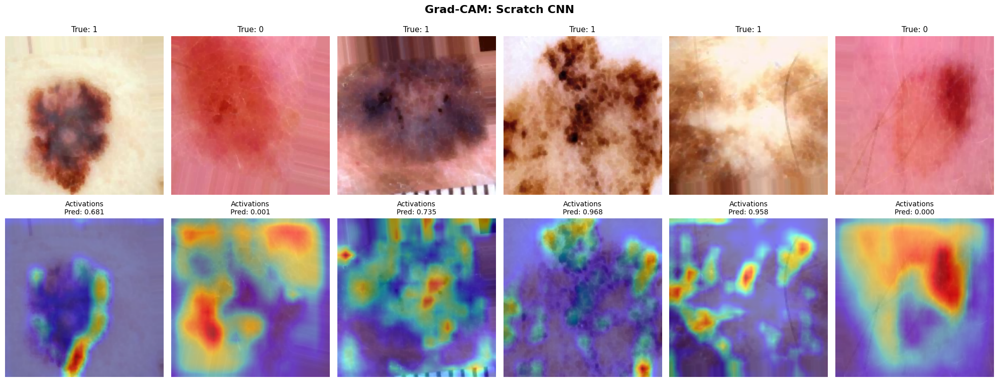

In [ ]:
test_samples = []
test_labels = []
for images, labels in test_ds.take(1):
    for i in range(min(6, len(images))):
        test_samples.append(images[i].numpy())
        test_labels.append(labels[i].numpy())

def activation_map(model, img, layer_name):
    img_array = np.expand_dims(img, axis=0)
    base_model = model.layers[0]
    target_layer = base_model.get_layer(layer_name)

    activation_model = tf.keras.Model(base_model.input, target_layer.output)
    activations = activation_model.predict(img_array, verbose=0)

    heatmap = np.mean(activations[0], axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap = heatmap / (heatmap.max() + 1e-8)

    return heatmap

fig, axes = plt.subplots(2, 6, figsize=(20, 8))
fig.suptitle('Activation Maps: MobileNetV2', fontsize=16, fontweight='bold')

for i, (img, label) in enumerate(zip(test_samples, test_labels)):
    axes[0, i].imshow(img)
    axes[0, i].set_title(f'True: {int(label)}', fontsize=11)
    axes[0, i].axis('off')

    try:
        heatmap = activation_map(mobile_model, img, 'out_relu')
        heatmap_resized = cv2.resize(heatmap, (224, 224))
        pred = mobile_model.predict(np.expand_dims(img, 0), verbose=0)[0][0]

        axes[1, i].imshow(img)
        axes[1, i].imshow(heatmap_resized, cmap='jet', alpha=0.5)
        axes[1, i].set_title(f'Pred: {pred:.3f}', fontsize=11)
        axes[1, i].axis('off')
    except Exception:
        axes[1, i].imshow(img)
        axes[1, i].set_title('ERROR', fontsize=11, color='red')
        axes[1, i].axis('off')

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(2, 6, figsize=(20, 8))
fig.suptitle('Activation Maps: EfficientNetB0', fontsize=16, fontweight='bold')

for i, (img, label) in enumerate(zip(test_samples, test_labels)):
    axes[0, i].imshow(img)
    axes[0, i].set_title(f'True: {int(label)}', fontsize=11)
    axes[0, i].axis('off')

    try:
        heatmap = activation_map(efficient_model, img, 'top_activation')
        heatmap_resized = cv2.resize(heatmap, (224, 224))
        pred = efficient_model.predict(np.expand_dims(img, 0), verbose=0)[0][0]

        axes[1, i].imshow(img)
        axes[1, i].imshow(heatmap_resized, cmap='jet', alpha=0.5)
        axes[1, i].set_title(f'Pred: {pred:.3f}', fontsize=11)
        axes[1, i].axis('off')
    except Exception:
        axes[1, i].imshow(img)
        axes[1, i].set_title('ERROR', fontsize=11, color='red')
        axes[1, i].axis('off')

plt.tight_layout()
plt.show()

def get_layer_by_name(model, layer_name):
    try:
        return model.get_layer(layer_name)
    except:
        pass

    for layer in model.layers:
        if hasattr(layer, 'layers'):
            try:
                return layer.get_layer(layer_name)
            except:
                pass

    raise ValueError(f"Layer '{layer_name}' not found!")

def make_gradcam(model, img_array, layer_name):
    conv_layer = get_layer_by_name(model, layer_name)
    grad_model = tf.keras.Model(
        inputs=model.inputs,
        outputs=[conv_layer.output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(img_array)
        loss = predictions[:, 0]

    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_output = conv_output[0].numpy()
    pooled_grads = pooled_grads.numpy()

    for i in range(len(pooled_grads)):
        conv_output[:, :, i] *= pooled_grads[i]

    heatmap = np.mean(conv_output, axis=-1)
    heatmap = np.maximum(heatmap, 0)

    if heatmap.max() > 0:
        heatmap = heatmap / heatmap.max()

    return heatmap

def make_activations(model, img_array, layer_name):
    conv_layer = get_layer_by_name(model, layer_name)
    activation_model = tf.keras.Model(
        inputs=model.inputs,
        outputs=conv_layer.output
    )

    activations = activation_model.predict(img_array, verbose=0)
    heatmap = np.mean(activations[0], axis=-1)
    heatmap = np.maximum(heatmap, 0)

    if heatmap.max() > 0:
        heatmap = heatmap / heatmap.max()

    return heatmap

configs = [
    {
        'name': 'Scratch CNN',
        'model': scratch_model,
        'layer': 'conv2d_6'
    }
]

for config in configs:
    fig, axes = plt.subplots(2, 6, figsize=(20, 8))
    fig.suptitle(f"Grad-CAM: {config['name']}", fontsize=16, fontweight='bold')

    for i, (img, label) in enumerate(zip(test_samples, test_labels)):
        axes[0, i].imshow(img)
        axes[0, i].set_title(f'True: {int(label)}', fontsize=11)
        axes[0, i].axis('off')

        img_batch = np.expand_dims(img, axis=0)

        try:
            heatmap = make_gradcam(config['model'], img_batch, config['layer'])
            method = 'Grad-CAM'
        except Exception:
            try:
                heatmap = make_activations(config['model'], img_batch, config['layer'])
                method = 'Activations'
            except Exception:
                axes[1, i].imshow(img)
                axes[1, i].set_title('FAILED', fontsize=11, color='red')
                axes[1, i].axis('off')
                continue

        heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
        pred = config['model'].predict(img_batch, verbose=0)[0][0]

        axes[1, i].imshow(img)
        axes[1, i].imshow(heatmap_resized, cmap='jet', alpha=0.5)
        axes[1, i].set_title(f'{method}\nPred: {pred:.3f}', fontsize=10)
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()